In [1]:
import sys
sys.path.append('C:\\Users\\alicj\\Documents\\GitHub\\RGCPD')

import pandas as pd
import numpy as np
import os, inspect
from RGCPD import RGCPD
from RGCPD import BivariateMI
import class_BivariateMI, functions_pp
from stat_models_cont import ScikitModel
from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegressionCV
from pipeline.data_preparations import coordinates, data_steps, mean, xarray
import func_models as fc_utils
from pipeline import pipeline

%load_ext autoreload
%autoreload 2

# main directory is the directory of this notebook
main_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe()))) 

# my main directory (which contains folders with data etc)
my_main_dir = 'C:\\Users\\alicj\\Desktop\\WORK'
data_path = os.path.join(my_main_dir, 'data')

Not able to load in plotting modules, check installment of networkx


In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import colors

In [3]:
from RGCPD import core_pp

In [6]:
pre = pd.read_csv('C:\\Users\\alicj\\Desktop\\gaza_ndj_predicted.csv')
obs = pd.read_csv('C:\\Users\\alicj\\Desktop\\gaza_ndj_observed.csv')

In [35]:
data_ond = pd.read_csv(os.path.join(data_path, 'OND.X1981_X2020.csv'))
data_ndj = pd.read_csv(os.path.join(data_path, 'NDJ.X1982_X2020.csv'))
data_djf = pd.read_csv(os.path.join(data_path, 'DJF.X1982_X2020.csv'))
data_jfm = pd.read_csv(os.path.join(data_path, 'JFM.X1981_X2020.csv'))

In [36]:
data_ond.columns = data_ond.columns.str.replace('[X]', '')
data_ndj.columns = data_ndj.columns.str.replace('[X]', '')
data_djf.columns = data_djf.columns.str.replace('[X]', '')
data_jfm.columns = data_jfm.columns.str.replace('[X]', '')

In [5]:
data_djf.head()

,V1,V2,1982,1983,1984,1985,1986,1987,1988,1989,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,30.225,-10.475,541,831,854,849,796,862,810,666,...,719,675,837,984,629,712,742,778,827,811
1,30.275,-10.475,560,843,877,836,813,876,826,673,...,717,660,848,989,647,712,758,779,833,828
2,30.325,-10.475,571,875,885,864,855,916,824,698,...,738,681,869,1029,665,740,778,807,853,853
3,30.375,-10.475,573,874,902,823,880,907,832,709,...,732,674,872,1027,674,739,789,808,849,862
4,30.425,-10.475,571,840,898,781,848,898,825,717,...,738,675,866,1019,672,730,782,795,841,851


# Prediction function to get AUC

prediction type is universally set to 'events' and the threshold value is set to 0.66

In [49]:
import func_models as fc_utils
from stat_models_cont import ScikitModel
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression


# choose type prediciton (continuous or probabilistic) by making comment #
#prediction = 'continuous'   
prediction = 'events' ; q = .66 # quantile threshold for event definition

def pred(rg, prediction = 'events', q = 0.66):
    if prediction == 'continuous':
        model = ScikitModel(Ridge, verbosity=0)
        # You can also tune parameters by passing a list of values. Then GridSearchCV from sklearn will 
        # find the set of parameters that give the best mean score on all kfold test sets. 
        # below we pass a list of alpha's to tune the regularization.
        alphas = list(np.concatenate([[1E-20],np.logspace(-5,0, 6), np.logspace(.01, 2.5, num=25)]))                       
        kwrgs_model = {'scoringCV':'neg_mean_absolute_error',
                       'kfold':5,
                       'alpha':alphas} # large a, strong regul.
    elif prediction == 'events':
        model = ScikitModel(LogisticRegression, verbosity=0)
        kwrgs_model = {'C':[1E-3, 1E-1, 1, 5, 10, 20, 30],
                        'kfold':10,
                        'solver':'lbfgs',
                        'penalty':'l2',
                        'scoringCV':'neg_brier_score'}

    target_ts = rg.TV.RV_ts ; 
    target_ts = (target_ts - target_ts.mean()) / target_ts.std()
    if prediction == 'events':
        if q >= 0.5:
            target_ts = (target_ts > target_ts.quantile(q)).astype(int)
        elif q < .5:
            target_ts = (target_ts < target_ts.quantile(q)).astype(int)
        BSS = fc_utils.ErrorSkillScore(constant_bench=float(target_ts.mean())).BSS
        score_func_list = [BSS, fc_utils.metrics.roc_auc_score]

    elif prediction == 'continuous':
        RMSE_SS = fc_utils.ErrorSkillScore(constant_bench=float(target_ts.mean())).RMSE
        MAE_SS = fc_utils.ErrorSkillScore(constant_bench=float(target_ts.mean())).MAE
        score_func_list = [RMSE_SS, fc_utils.corrcoef, MAE_SS]


    keys = [k for k in rg.df_data.columns[1:-2]]

    # Perform cross-validated Ridge regression to predict the target -> returns predict (DataFrame), weights (DataFrame), models_lags (dict).
    pred_tuple = rg.fit_df_data_ridge(target=target_ts,
                                keys=keys, 
                                fcmodel=model,
                                kwrgs_model=kwrgs_model,
                                transformer=None,
                                tau_min=0, tau_max=0) # <- lag should be zero

    predict, weights, model_lags = pred_tuple

    rg.pred_tuple = pred_tuple  # (predict dataframe, weights dataframe, model_lags)
    verif_tuple = fc_utils.get_scores(predict,
                                    rg.df_data.iloc[:,-2:],
                                    score_func_list,
                                    n_boot = 100, # bootstrapping for Conf. Intervals
                                    score_per_test=False,
                                    blocksize=1,
                                    rng_seed=1)
    df_train_m, df_test_s_m, df_test_m, df_boot = verif_tuple
    rg.verif_tuple = verif_tuple                                                                     
    if prediction == 'events':
        print(model.scikitmodel.__name__, '\n', f'Test score\n',
              'BSS {:.2f}\n'.format(df_test_m.loc[0].loc[0].loc['BSS']),
              'AUC {:.2f}'.format(df_test_m.loc[0].loc[0].loc['roc_auc_score']),
              '\nTrain score\n',
              'BSS {:.2f}\n'.format(df_train_m.mean(0).loc[0]['BSS']),
              'AUC {:.2f}'.format(df_train_m.mean(0).loc[0]['roc_auc_score']))
        auc_train = df_train_m.mean(0).loc[0]['roc_auc_score']
        auc_test = df_test_m.loc[0].loc[0].loc['roc_auc_score']
        bss_test = df_test_m.mean(0).loc[0]['BSS']
        return auc_test, bss_test
    elif prediction == 'continuous':
        print(model.scikitmodel.__name__, '\n', 'Test score\n',
              'RMSE {:.2f}\n'.format(df_test_m.loc[0][0]['RMSE']),
              'MAE {:.2f}\n'.format(df_test_m.loc[0][0]['MAE']),
              'corrcoef {:.2f}'.format(df_test_m.loc[0][0]['corrcoef']),
              '\nTrain score\n',
              'RMSE {:.2f}\n'.format(df_train_m.mean(0).loc[0]['RMSE']),
              'MAE {:.2f}\n'.format(df_train_m.mean(0).loc[0]['MAE']),
              'corrcoef {:.2f}'.format(df_train_m.mean(0).loc[0]['corrcoef']))

## Time handling

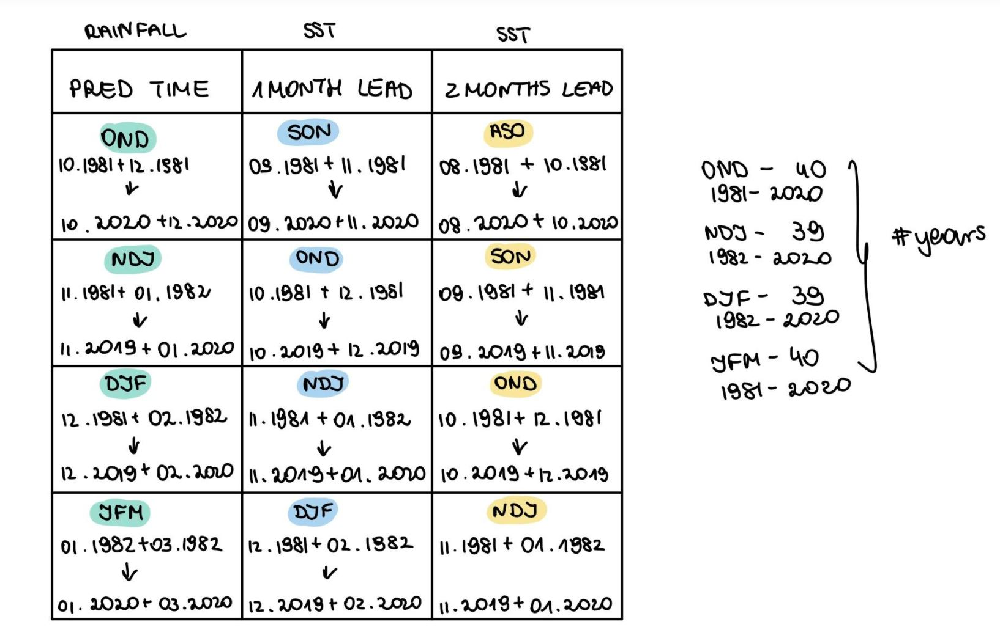

In [7]:
from IPython.display import Image
Image(filename = os.path.join(data_path, 'time.jpg'), width = 700, height = 400)

OND 1981-2020, NDJ 1982-2020, DJF 1982-2020, JFM 1981-2020; year -> year of the last month, e.g. DJF 1982 means December 1981-February 1982

# define parameters that stay the same for all predictions

In [43]:
function = class_BivariateMI.corr_map
alpha = 0.01
FDR_control = True 
distance_eps = 500
min_area_in_degrees2 = 5
tfreq = None

TVdates_aggr = False
ext_annual_to_mon = False 
method = 'leave_1'
#method = 'random_10'
detrend = True
labels = True
pred_type = 'continuous'
q = 0.6
name = 'rainfall'

# Tete predictions

### OND

In [8]:
tete_ond = coordinates(data_ond, [30.21215, 35.346607], [-17.70114, -13.9988])
tete_ond.head()

,V1,V2,1981,1982,1983,1984,1985,1986,1987,1988,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
14807,30.225,-14.025,135,242,241,309,277,299,245,205,...,245,258,314,220,230,291,346,248,185,354
14808,30.275,-14.025,135,244,243,303,274,301,246,206,...,244,258,317,219,226,294,351,254,191,360
14809,30.325,-14.025,132,223,226,321,274,314,229,207,...,248,243,305,220,223,274,362,258,192,357
14810,30.375,-14.025,135,222,226,327,269,308,224,217,...,248,240,304,218,226,275,380,265,198,361
14811,30.425,-14.025,135,228,215,322,272,310,228,219,...,253,239,305,212,221,267,389,266,199,359


In [9]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for OND per year
tete_ond_data = data_steps(tete_ond, 'rainfall') 
tete_ond_data.head()

,rainfall
index,
1981-01-01,199.479664
1982-01-01,234.457885
1983-01-01,217.502493
1984-01-01,325.231829
1985-01-01,373.997901


In [10]:
xarray(tete_ond_data).to_netcdf(os.path.join(data_path, 'tete_ond_aggr.nc'))

In [11]:
# directory of target variable data
TV_path = os.path.join(data_path, 'tete_ond_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

## 1 month lead time (SON)

In [12]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2] regions in total (list of different splits)


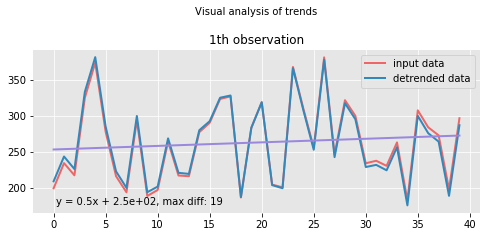

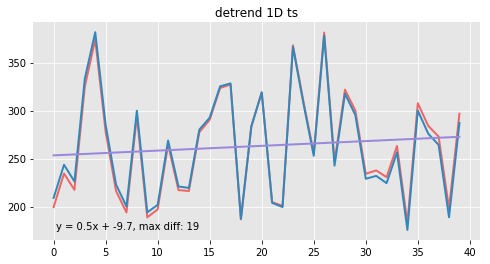

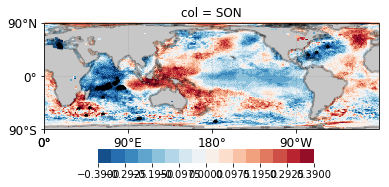

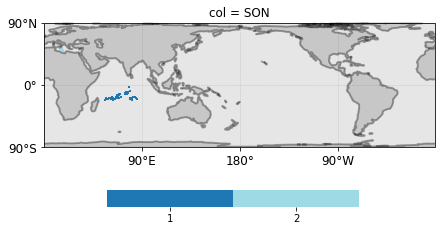

In [13]:
rg_tete_ond1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 2 months lead time (ASO)

In [14]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [3, 3, 3, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 2, 3] regions in total (list of different splits)


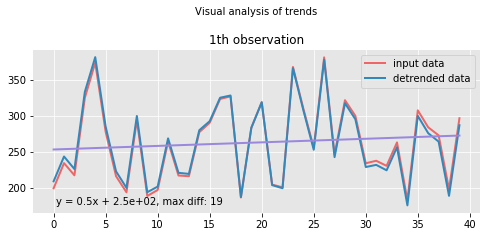

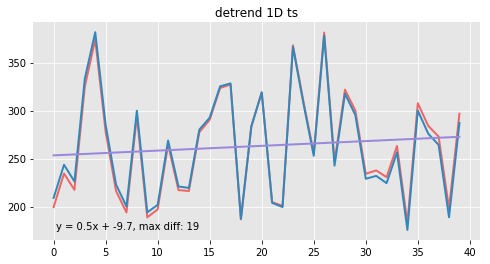

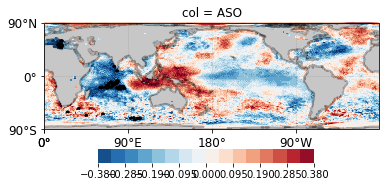

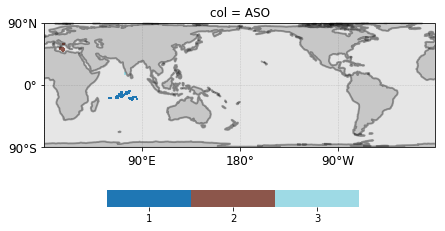

In [15]:
rg_tete_ond2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 3 months lead time (JAS)

In [16]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)


lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1] regions in total (list of different splits)


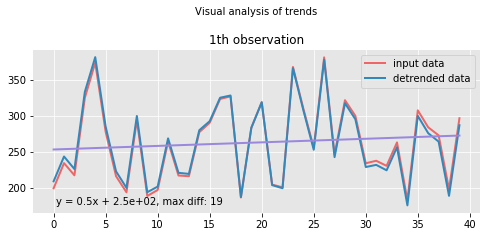

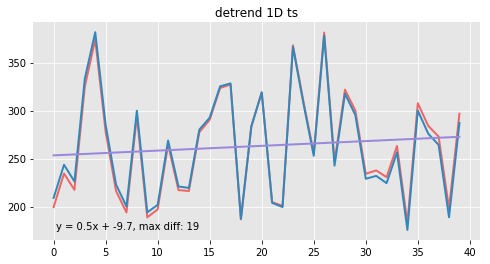

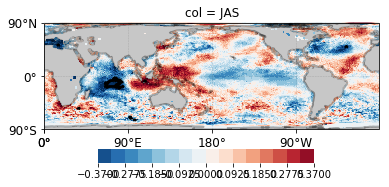

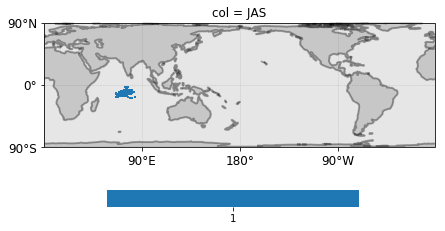

In [17]:
rg_tete_ond3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 4 months lead time (JJA)

In [18]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)


lags = np.array([['06-01', '08-01']])            
periodnames = ['JJA']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('06-01', '08-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JJA
Plotting Corr maps sst_labels_init, split 0, lag JJA

Getting MI timeseries
There are [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1] regions in total (list of different splits)


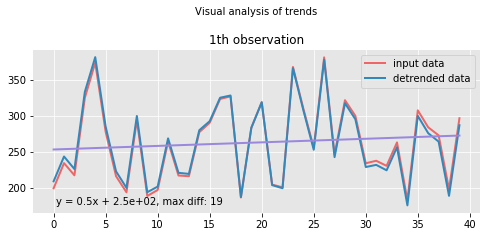

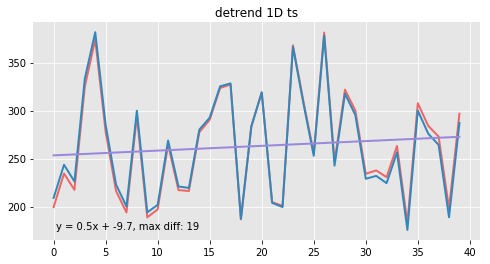

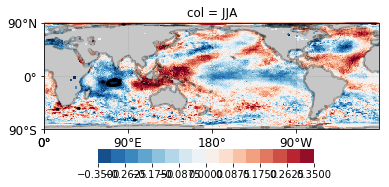

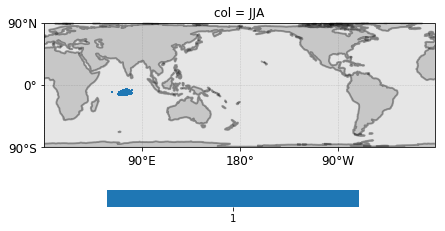

In [19]:
rg_tete_ond4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 5 months lead time (MJJ)

In [20]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)


lags = np.array([['05-01', '07-01']])            
periodnames = ['MJJ']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('05-01', '07-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag MJJ
Plotting Corr maps sst_labels_init, split 0, lag MJJ

Getting MI timeseries
There are [2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2] regions in total (list of different splits)


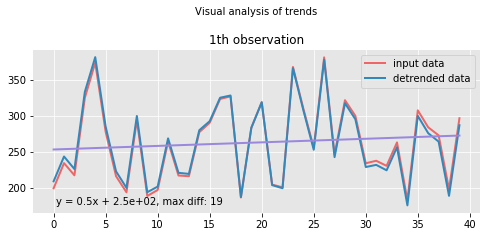

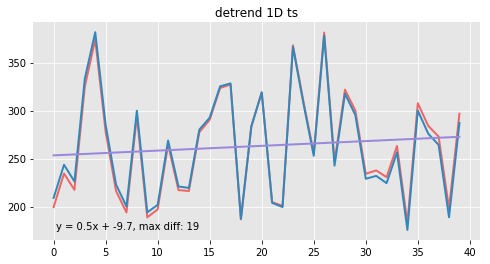

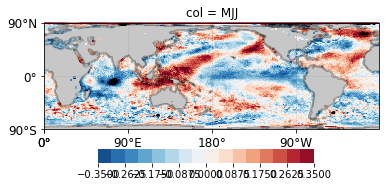

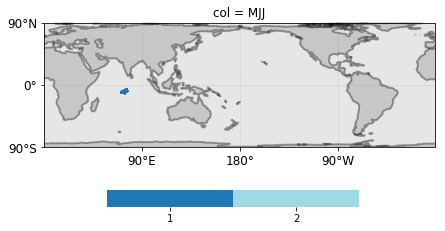

In [21]:
rg_tete_ond5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 6 months lead time (AMJ)

In [22]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['04-01', '06-01']])            
periodnames = ['AMJ']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('04-01', '06-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag AMJ
no sst regions that pass distance_eps and min_area_in_degrees2 citeria

Getting MI timeseries
No timeseries retrieved for sst on split 2
No timeseries retrieved for sst on split 6
No timeseries retrieved for sst on split 7
No timeseries retrieved for sst on split 8
No timeseries retrieved for sst on split 10
No timeseries retrieved for sst on split 12
No timeseries retrieved for sst on split 13
No timeseries retrieved for sst on split 14
No timeseries retrieved for sst on split 15
No timeseries retrieved for sst on split 16
No timeseries retrieved for sst on split 17
No timeseries retrieved for sst on split 19
No timeseries retrieved for sst on split 20
No timeseries retrieved for sst on split 21
No timeseries retrieved for sst on split 23
No timeseries retrieved for sst on split 24
No timeseries retrieved for sst on split 25
No timeseries retrieved for sst on split 26
No timeseries retrieved for sst on split 28
No timeseries retrieved for sst o

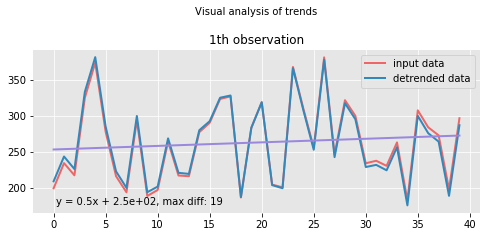

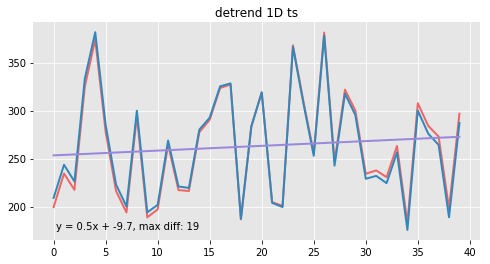

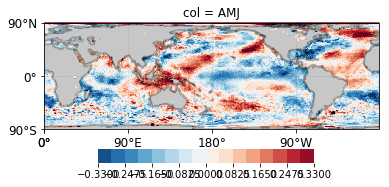

In [23]:
rg_tete_ond6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



### NDJ

In [24]:
tete_ndj = coordinates(data_ndj, [30.21215, 35.346607], [-17.70114, -13.9988])
tete_ndj.head()

,V1,V2,1982,1983,1984,1985,1986,1987,1988,1989,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
14807,30.225,-14.025,436,459,393,581,615,527,520,490,...,654,510,558,555,533,412,666,419,471,412
14808,30.275,-14.025,436,460,395,580,612,528,530,492,...,642,509,550,553,531,410,670,424,473,420
14809,30.325,-14.025,436,429,377,594,626,548,504,475,...,632,517,525,535,523,409,646,437,470,422
14810,30.375,-14.025,442,446,383,607,625,561,501,463,...,635,516,516,536,515,408,646,453,476,423
14811,30.425,-14.025,445,449,367,607,634,566,494,470,...,653,533,519,540,521,403,641,462,476,424


In [25]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for NDJ per year
tete_ndj_data = data_steps(tete_ndj, 'rainfall') 
tete_ndj_data.head()

,rainfall
index,
1982-01-01,421.366308
1983-01-01,346.583443
1984-01-01,320.506691
1985-01-01,580.628313
1986-01-01,635.651535


In [26]:
xarray(tete_ndj_data).to_netcdf(os.path.join(data_path, 'tete_ndj_aggr.nc'))

In [27]:
# directory of target variable data
TV_path = os.path.join(data_path, 'tete_ndj_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

## 1 month lead time (OND)

In [28]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['10-01', '12-01']])            
periodnames = ['OND']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('10-01', '12-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag OND
Plotting Corr maps sst_labels_init, split 0, lag OND

Getting MI timeseries
There are [11, 9, 11, 11, 9, 11, 11, 11, 10, 11, 9, 11, 11, 9, 11, 11, 11, 8, 11, 11, 11, 10, 11, 11, 11, 11, 11, 11, 11, 9, 11, 11, 11, 11, 9, 11, 10, 11, 11] regions in total (list of different splits)


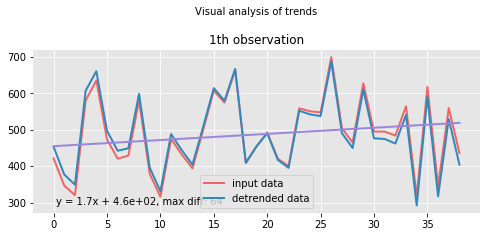

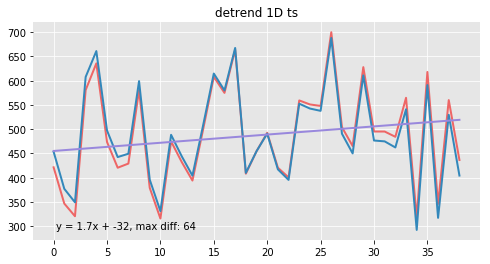

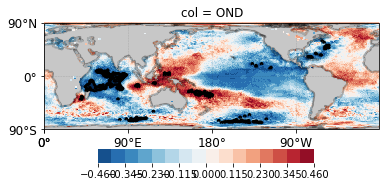

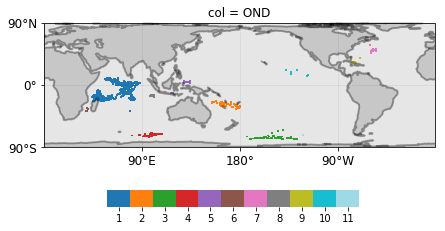

In [29]:
rg_tete_ndj1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 2 months lead time (SON)

In [30]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8, 8, 8, 6, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 7, 8, 8, 8, 8, 7, 8, 8, 8, 8] regions in total (list of different splits)


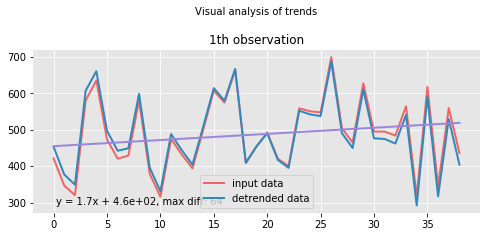

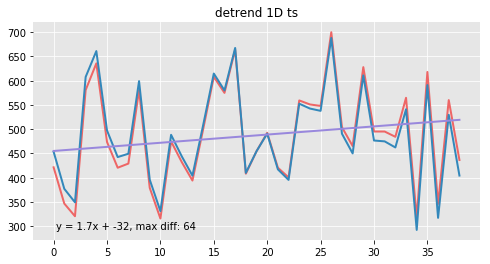

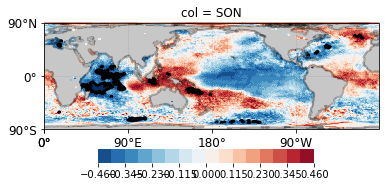

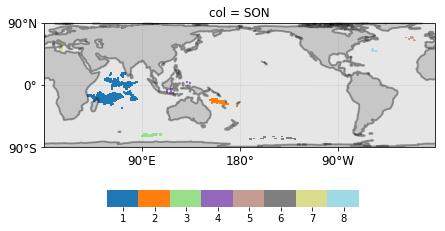

In [31]:
rg_tete_ndj2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 3 months lead time (ASO)

In [32]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 3, 4, 4, 4, 4, 3, 4, 4, 4, 4] regions in total (list of different splits)


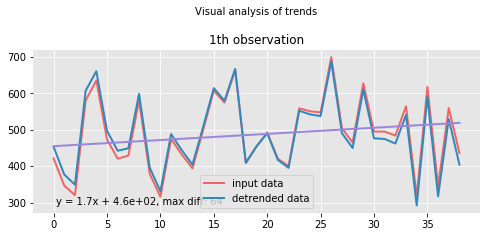

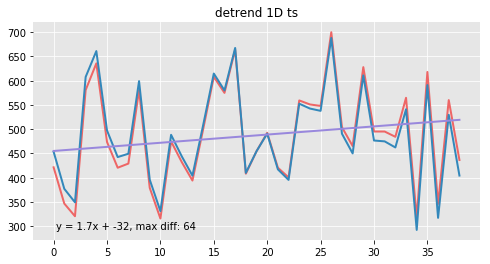

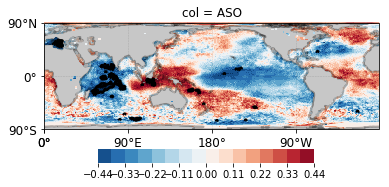

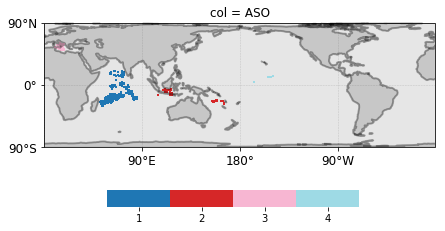

In [33]:
rg_tete_ndj3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 4 months lead time (JAS)

In [34]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6] regions in total (list of different splits)


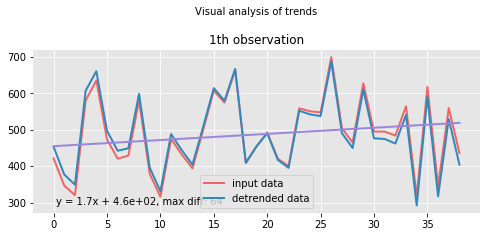

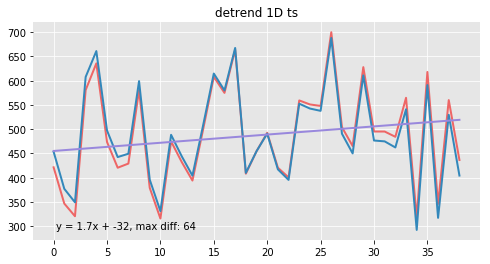

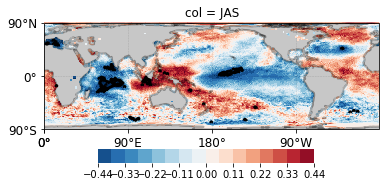

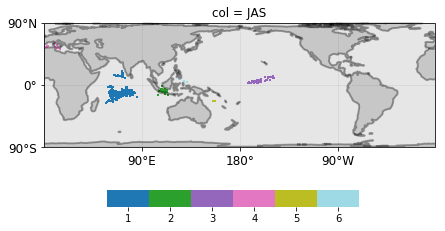

In [35]:
rg_tete_ndj4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 5 months lead time (JJA)

In [36]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['06-01', '08-01']])            
periodnames = ['JJA']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('06-01', '08-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JJA
Plotting Corr maps sst_labels_init, split 0, lag JJA

Getting MI timeseries
There are [5, 5, 5, 4, 5, 5, 5, 5, 4, 5, 4, 5, 5, 5, 5, 4, 4, 4, 4, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 5, 5] regions in total (list of different splits)


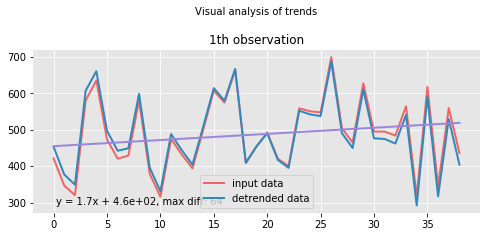

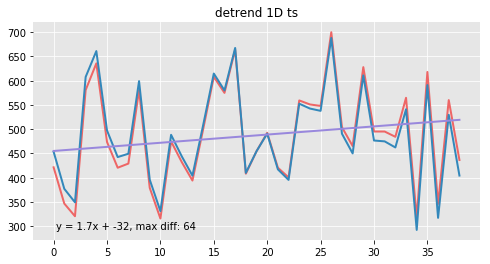

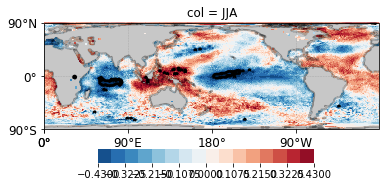

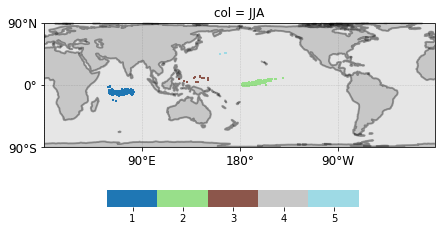

In [37]:
rg_tete_ndj5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



## 6 months lead time (MJJ)

In [38]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['05-01', '07-01']])            
periodnames = ['MJJ']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('05-01', '07-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag MJJ
Plotting Corr maps sst_labels_init, split 0, lag MJJ

Getting MI timeseries
There are [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 5, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7, 7, 5, 7, 7, 7, 7] regions in total (list of different splits)


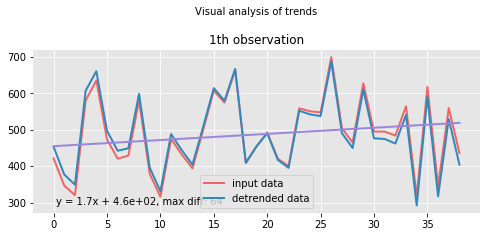

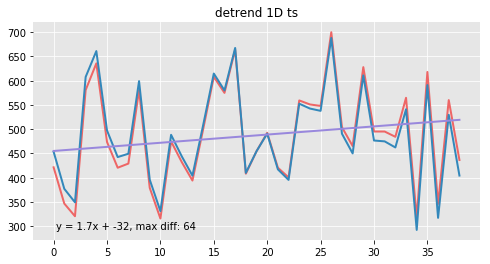

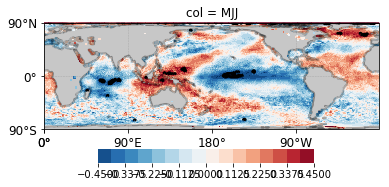

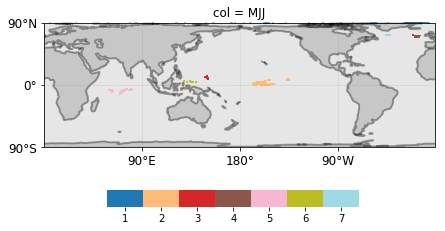

In [39]:
rg_tete_ndj6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)



### DJF

In [40]:
tete_djf = coordinates(data_djf, [30.21215, 35.346607], [-17.70114, -13.9988])
tete_djf.head()

,V1,V2,1982,1983,1984,1985,1986,1987,1988,1989,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
14807,30.225,-14.025,690,542,562,763,720,550,735,758,...,645,601,703,682,700,457,896,550,600,562
14808,30.275,-14.025,695,544,566,757,711,550,745,758,...,624,600,694,686,706,458,912,546,606,582
14809,30.325,-14.025,695,511,553,737,726,567,733,715,...,618,605,651,660,689,468,888,578,606,585
14810,30.375,-14.025,706,553,573,757,739,586,736,684,...,619,610,638,658,681,470,893,577,610,590
14811,30.425,-14.025,702,539,563,754,755,589,730,695,...,632,627,641,659,690,474,893,602,622,592


In [41]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for DJF per year
tete_djf_data = data_steps(tete_djf, 'rainfall') 
tete_djf_data.head()

,rainfall
index,
1982-01-01,627.368276
1983-01-01,451.618342
1984-01-01,499.367358
1985-01-01,705.254526
1986-01-01,722.697980


In [42]:
xarray(tete_djf_data).to_netcdf(os.path.join(data_path, 'tete_djf_aggr.nc'))

In [43]:
# directory of target variable data
TV_path = os.path.join(data_path, 'tete_djf_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

## 1 month lead time (NDJ)

In [44]:
start_end_year = (1981, 2020)
start_end_TVyear = (1982, 2020)

lags = np.array([['11-01', '01-01']])            
periodnames = ['NDJ']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('11-01', '01-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag NDJ
Plotting Corr maps sst_labels_init, split 0, lag NDJ

Getting MI timeseries
There are [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9] regions in total (list of different splits)


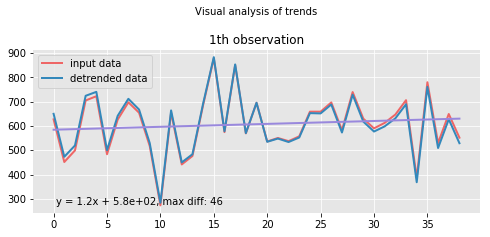

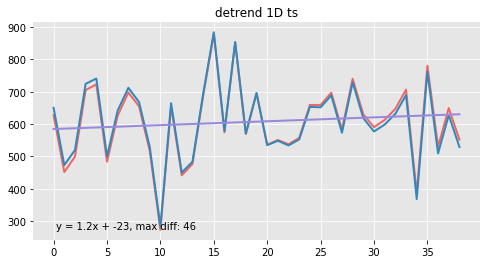

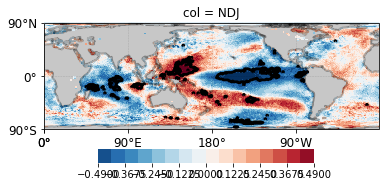

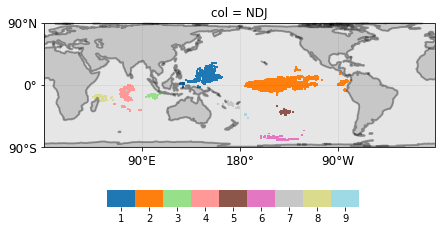

In [45]:
rg_tete_djf1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 2 months lead time (OND)

In [46]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['10-01', '12-01']])            
periodnames = ['OND']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('10-01', '12-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag OND
Plotting Corr maps sst_labels_init, split 0, lag OND

Getting MI timeseries
There are [9, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 7, 9, 9, 9] regions in total (list of different splits)


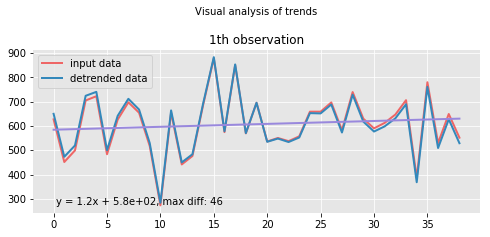

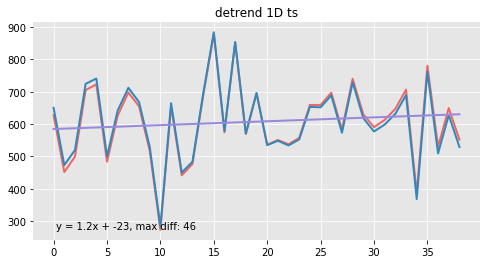

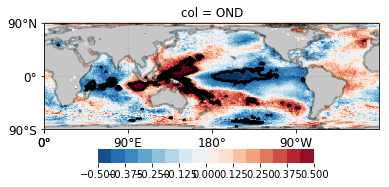

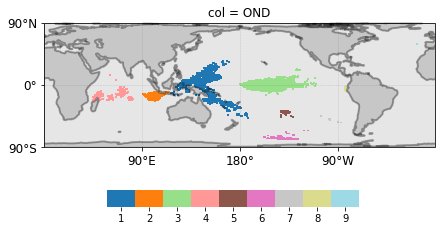

In [47]:
rg_tete_djf2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 3 months lead time (SON)

In [48]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8] regions in total (list of different splits)


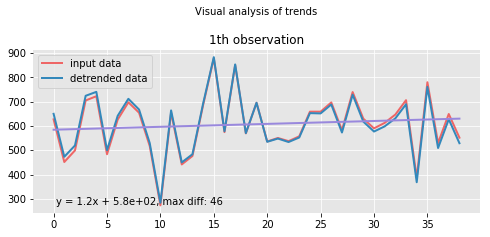

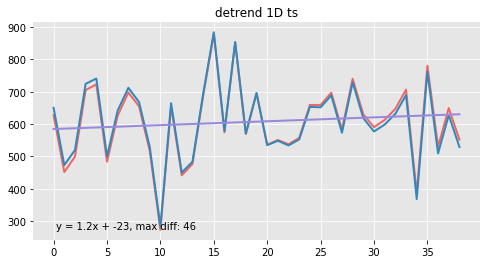

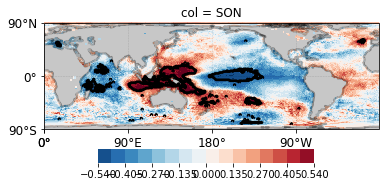

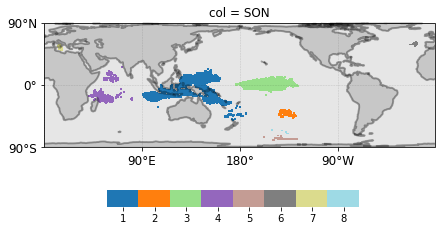

In [49]:
rg_tete_djf3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 4 month lead time (ASO)

In [50]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [10, 7, 9, 9, 10, 9, 10, 10, 10, 10, 8, 10, 9, 8, 9, 8, 10, 7, 10, 10, 10, 9, 9, 9, 9, 10, 10, 10, 10, 9, 10, 10, 9, 10, 6, 8, 10, 10, 10] regions in total (list of different splits)


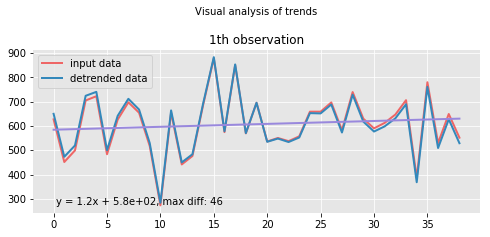

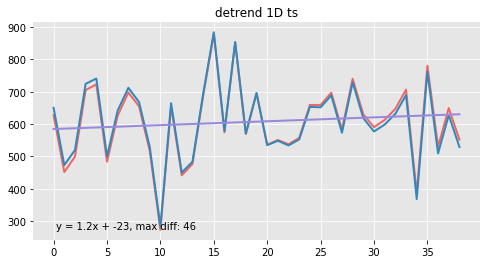

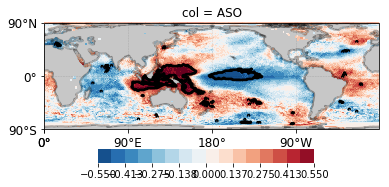

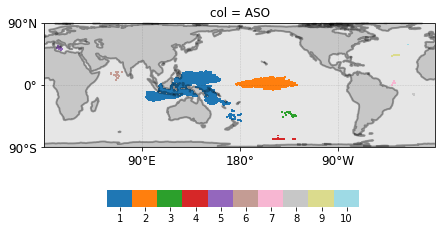

In [51]:
rg_tete_djf4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 5 month lead time (JAS)

In [52]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)


lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [8, 8, 8, 7, 8, 8, 8, 8, 8, 8, 6, 8, 8, 8, 8, 8, 8, 6, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8] regions in total (list of different splits)


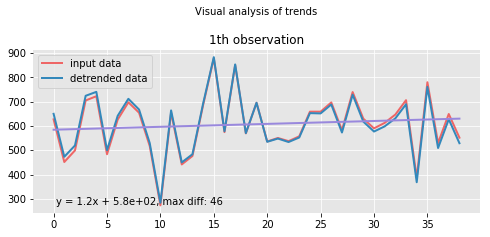

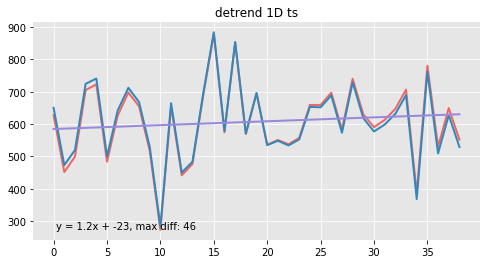

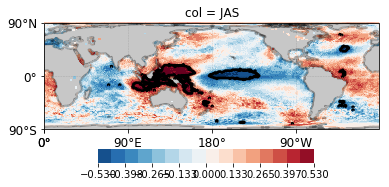

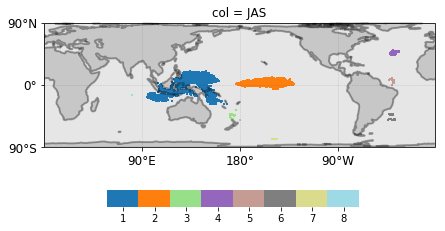

In [53]:
rg_tete_djf5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 6 month lead time (JJA)

In [54]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['06-01', '08-01']])            
periodnames = ['JJA']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('06-01', '08-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JJA
Plotting Corr maps sst_labels_init, split 0, lag JJA

Getting MI timeseries
There are [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6] regions in total (list of different splits)


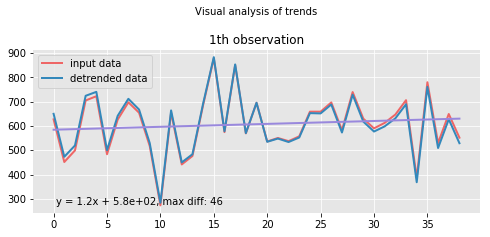

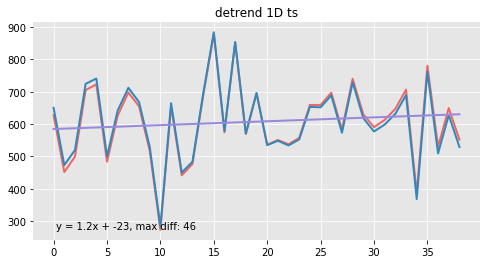

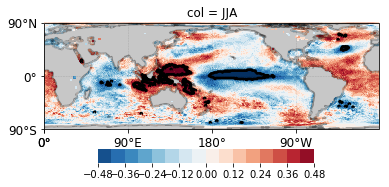

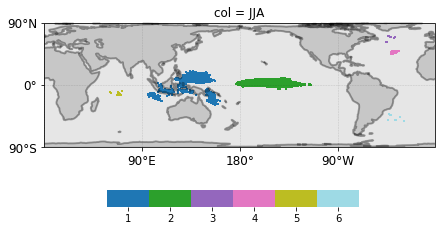

In [55]:
rg_tete_djf6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


### JFM

In [56]:
tete_jfm = coordinates(data_jfm, [30.21215, 35.346607], [-17.70114, -13.9988])
tete_jfm.head()

,V1,V2,1981,1982,1983,1984,1985,1986,1987,1988,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
14807,30.225,-14.025,527,636,473,493,619,611,421,701,...,452,594,543,537,584,466,794,457,466,504
14808,30.275,-14.025,523,640,474,490,613,606,419,709,...,439,598,534,534,591,449,805,448,462,520
14809,30.325,-14.025,518,641,447,488,584,631,413,721,...,431,595,500,515,571,439,793,492,452,520
14810,30.375,-14.025,520,648,483,528,589,664,421,750,...,440,596,494,518,564,438,799,485,455,522
14811,30.425,-14.025,530,650,470,525,594,685,424,742,...,448,618,501,518,582,461,810,508,471,524


In [57]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for JFM per year
tete_jfm_data = data_steps(tete_jfm, 'rainfall') 
tete_jfm_data.head()

,rainfall
index,
1981-01-01,549.967069
1982-01-01,550.434532
1983-01-01,377.101023
1984-01-01,457.554972
1985-01-01,647.911834


In [58]:
xarray(tete_jfm_data).to_netcdf(os.path.join(data_path, 'tete_jfm_aggr.nc'))

In [59]:
# directory of target variable data
TV_path = os.path.join(data_path, 'tete_jfm_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

### 1 month lead time (DJF)

In [60]:
start_end_year = (1981, 2020)
start_end_TVyear = (1982, 2020)

lags = np.array([['12-01', '02-01']])            
periodnames = ['DJF']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('12-01', '02-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag DJF
Plotting Corr maps sst_labels_init, split 0, lag DJF

Getting MI timeseries
There are [8, 7, 7, 8, 8, 7, 8, 7, 8, 8, 5, 8, 8, 7, 8, 7, 8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8] regions in total (list of different splits)


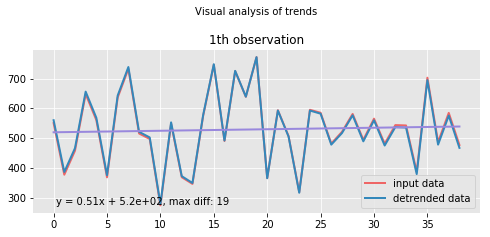

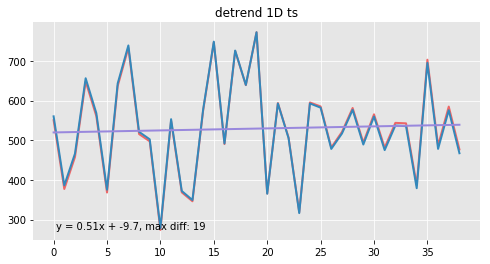

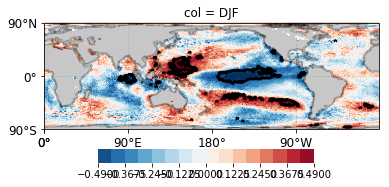

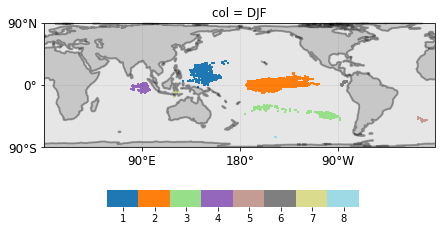

In [61]:
rg_tete_jfm1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


### 2 months lead time (NDJ)

In [62]:
start_end_year = (1981, 2020)
start_end_TVyear = (1982, 2020)

lags = np.array([['11-01', '01-01']])            
periodnames = ['NDJ']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('11-01', '01-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag NDJ
Plotting Corr maps sst_labels_init, split 0, lag NDJ

Getting MI timeseries
There are [11, 10, 11, 10, 11, 10, 11, 11, 11, 11, 8, 11, 10, 9, 11, 10, 11, 7, 11, 11, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 9, 11, 11, 11, 11] regions in total (list of different splits)


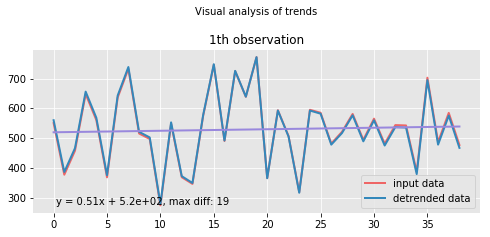

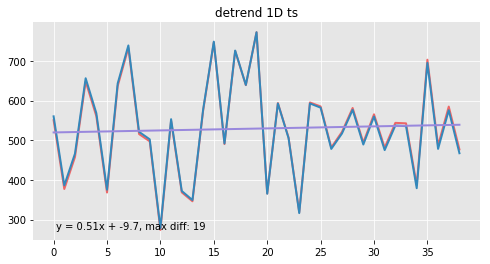

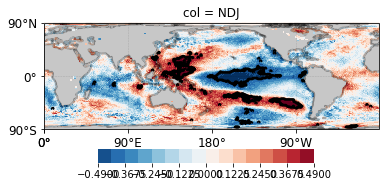

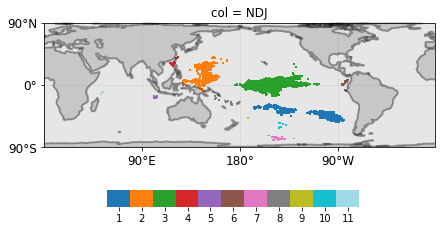

In [63]:
rg_tete_jfm2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 3 months lead time (OND)

In [64]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['10-01', '12-01']])            
periodnames = ['OND']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('10-01', '12-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag OND
Plotting Corr maps sst_labels_init, split 0, lag OND

Getting MI timeseries
There are [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8] regions in total (list of different splits)


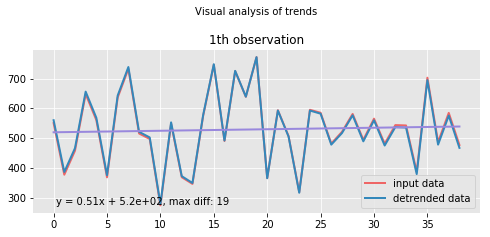

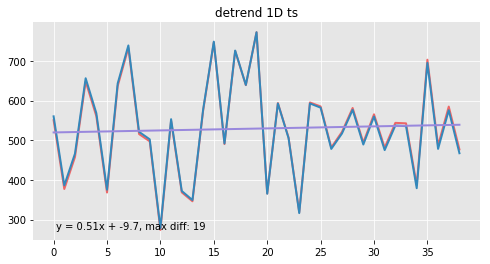

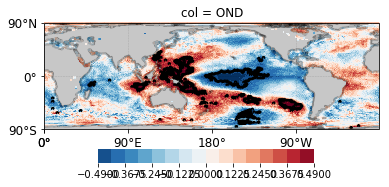

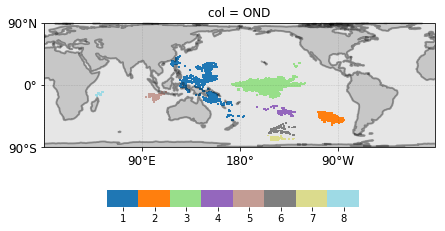

In [65]:
rg_tete_jfm3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 4 months lead time (SON)

In [66]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [7, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7, 7, 7, 7, 7, 5, 7, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7] regions in total (list of different splits)


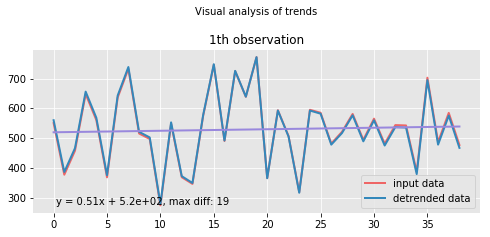

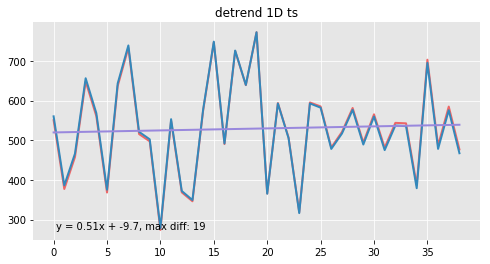

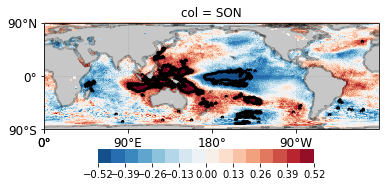

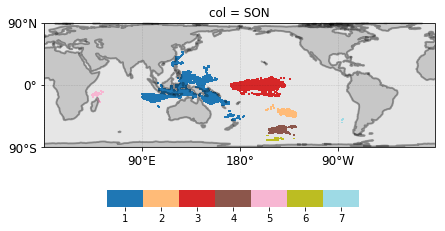

In [67]:
rg_tete_jfm4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 5 months lead time (ASO)

In [68]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9] regions in total (list of different splits)


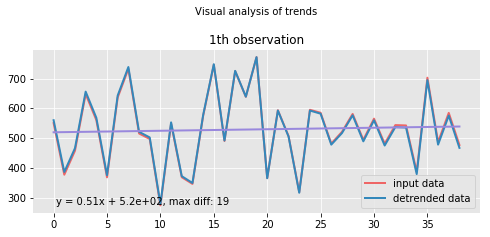

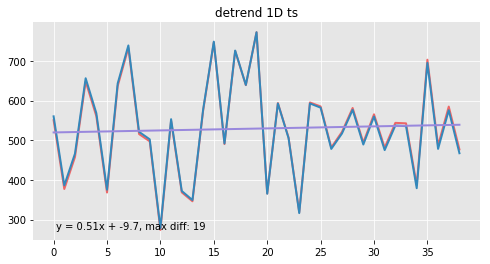

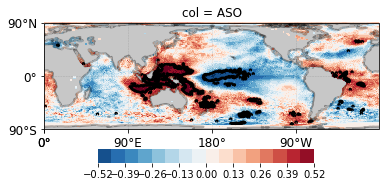

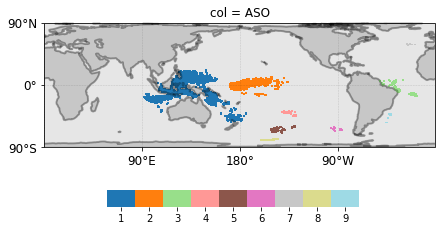

In [69]:
rg_tete_jfm5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


## 6 months lead time (JAS)

In [70]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [10, 9, 9, 8, 9, 10, 9, 9, 10, 9, 9, 10, 10, 9, 9, 8, 9, 9, 9, 10, 10, 9, 10, 9, 10, 9, 10, 10, 9, 9, 10, 9, 9, 10, 8, 9, 9, 9, 10] regions in total (list of different splits)


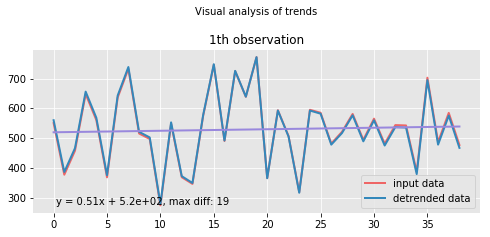

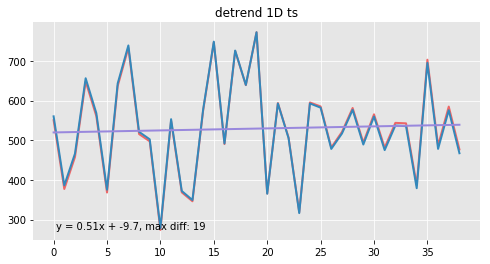

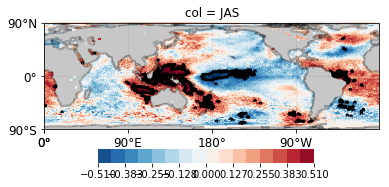

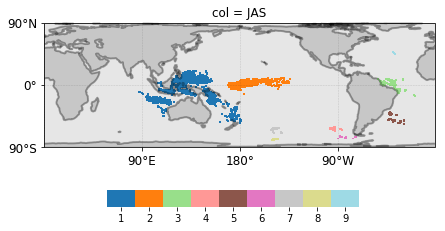

In [71]:
rg_tete_jfm6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)


# Gaza predictions

### OND

In [9]:
gaza_ond = coordinates(data_ond, [31.30631, 34.47342], [-25.38095, -21.30902])
gaza_ond.head()

,V1,V2,1981,1982,1983,1984,1985,1986,1987,1988,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
37264,31.325,-21.325,176,121,165,312,195,142,305,106,...,235,104,191,183,80,295,183,109,146,258
37265,31.375,-21.325,168,119,161,288,181,134,282,97,...,222,98,179,175,80,280,166,104,132,239
37266,31.425,-21.325,159,111,150,273,195,153,249,98,...,213,96,168,168,79,266,154,105,128,227
37267,31.475,-21.325,150,108,134,259,187,142,255,109,...,206,89,156,163,75,251,136,95,117,220
37268,31.525,-21.325,169,108,134,258,187,143,256,111,...,208,93,157,166,77,251,133,101,117,219


In [73]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for OND per year
gaza_ond_data = data_steps(gaza_ond, 'rainfall') 
gaza_ond_data.head()

,rainfall
index,
1981-01-01,221.933929
1982-01-01,131.531746
1983-01-01,182.690079
1984-01-01,230.486706
1985-01-01,217.497421


In [74]:
xarray(gaza_ond_data).to_netcdf(os.path.join(data_path, 'gaza_ond_aggr.nc'))

In [75]:
# directory of target variable data
TV_path = os.path.join(data_path, 'gaza_ond_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

### 1 month lead time

In [76]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9] regions in total (list of different splits)


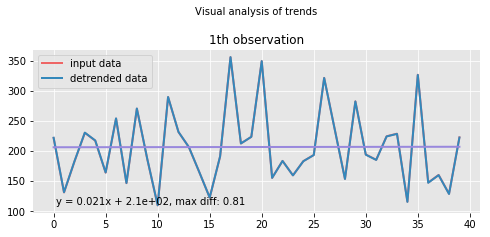

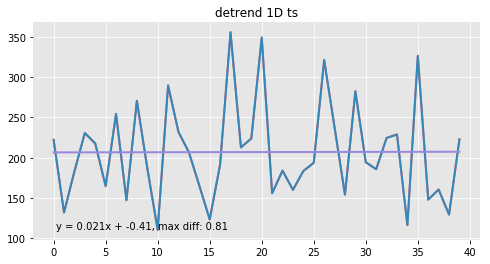

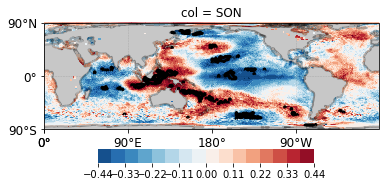

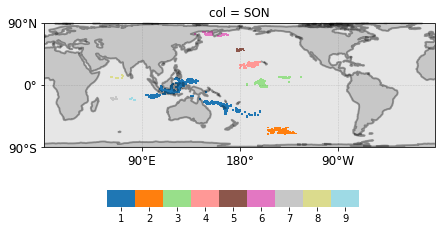

In [77]:
rg_gaza_ond1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 2 months lead time

In [78]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [11, 9, 11, 11, 10, 10, 11, 10, 11, 10, 10, 11, 11, 10, 10, 10, 10, 5, 11, 10, 9, 10, 10, 10, 10, 10, 9, 10, 11, 8, 11, 11, 10, 11, 8, 9, 10, 11, 10, 11] regions in total (list of different splits)


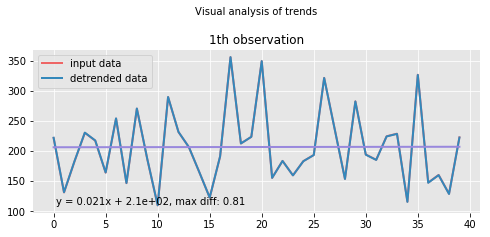

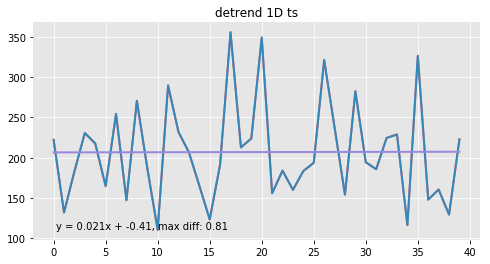

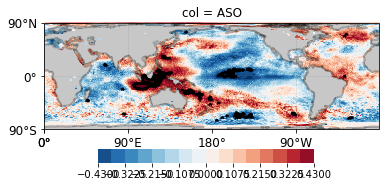

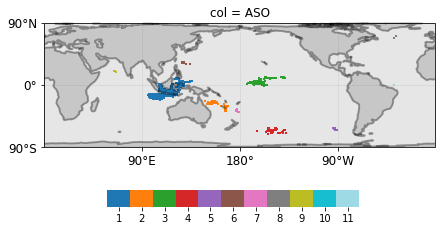

In [79]:
rg_gaza_ond2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 3 months lead time (JAS)

In [80]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('10-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 3, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5] regions in total (list of different splits)


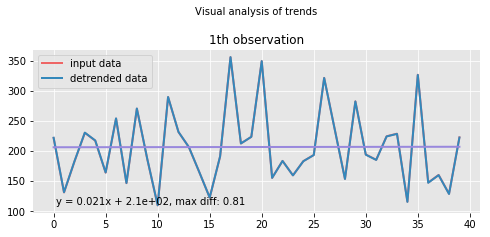

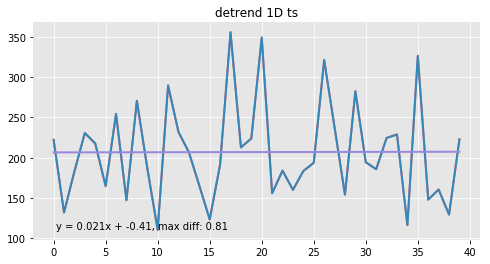

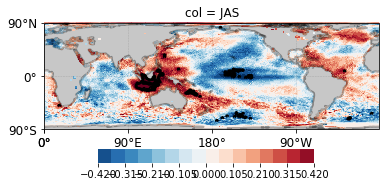

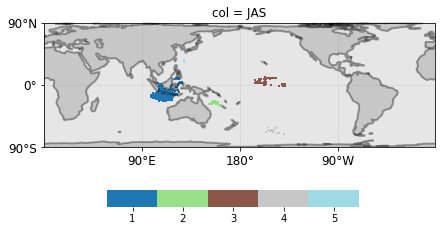

In [81]:
rg_gaza_ond3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 4 months lead time (JJA)

In [82]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)


lags = np.array([['06-01', '08-01']])            
periodnames = ['JJA']                                         
start_end_TVdate = ('10-01', '12-01') 

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('06-01', '08-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JJA
Plotting Corr maps sst_labels_init, split 0, lag JJA

Getting MI timeseries
There are [8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8, 8, 8, 5, 8, 8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 7, 8, 8, 8, 8, 7, 6, 8, 8, 8, 8] regions in total (list of different splits)


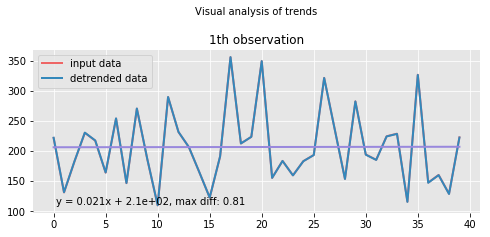

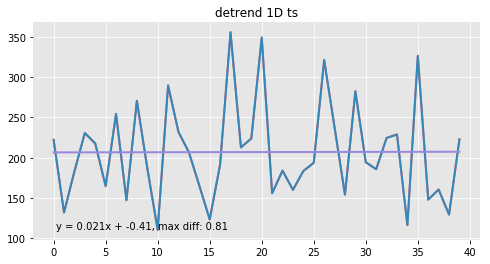

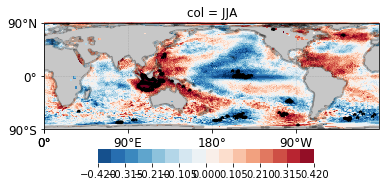

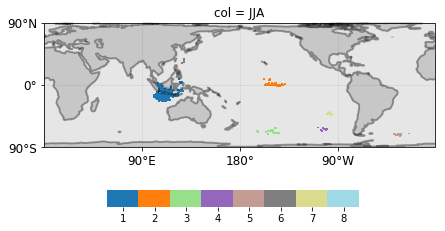

In [83]:
rg_gaza_ond4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 5 months lead time (MJJ)

In [84]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)


lags = np.array([['05-01', '07-01']])            
periodnames = ['MJJ']                                         
start_end_TVdate = ('10-01', '12-01') 

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('05-01', '07-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag MJJ
Plotting Corr maps sst_labels_init, split 0, lag MJJ

Getting MI timeseries
There are [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 5, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7] regions in total (list of different splits)


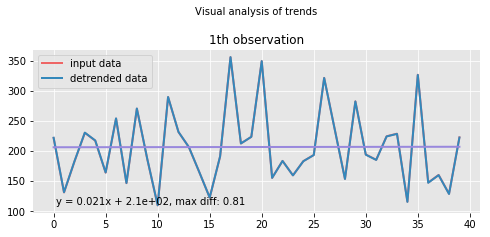

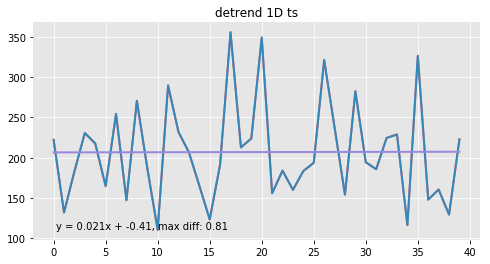

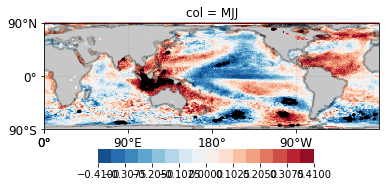

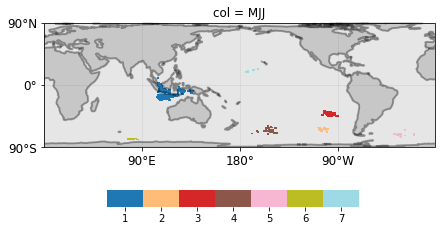

In [85]:
rg_gaza_ond5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 6 months lead time (AMJ)

In [86]:
start_end_year = (1981, 2020)
start_end_TVyear = (1981, 2020)

lags = np.array([['04-01', '06-01']])            
periodnames = ['AMJ']                                         
start_end_TVdate = ('10-01', '12-01')

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('04-01', '06-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(39dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag AMJ
Plotting Corr maps sst_labels_init, split 0, lag AMJ

Getting MI timeseries
There are [9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 8, 9, 9, 9, 9, 8, 9, 8, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 7, 8, 9, 8, 9] regions in total (list of different splits)


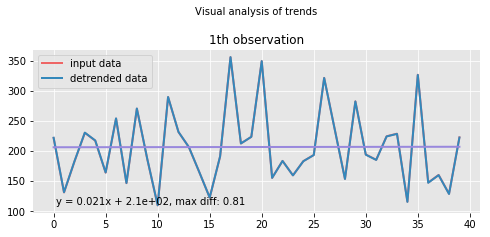

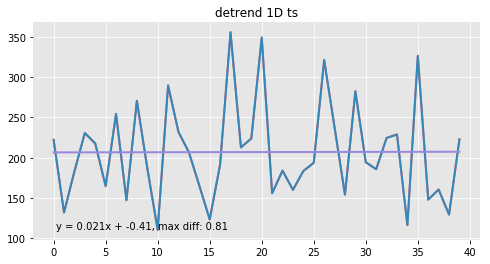

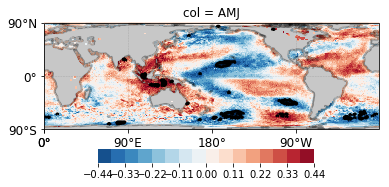

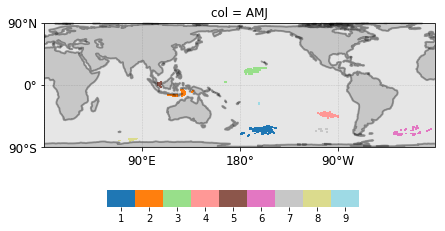

In [87]:
rg_gaza_ond6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### NDJ

In [37]:
gaza_ndj = coordinates(data_ndj, [31.30631, 34.47342], [-25.38095, -21.30902])
gaza_ndj.head()

,V1,V2,1982,1983,1984,1985,1986,1987,1988,1989,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
37264,31.325,-21.325,193,122,220,448,234,179,325,112,...,570,266,324,328,231,145,572,147,196,275
37265,31.375,-21.325,181,113,209,407,214,158,298,100,...,516,250,298,310,215,139,534,133,178,247
37266,31.425,-21.325,162,109,174,360,229,154,257,90,...,427,230,244,268,193,125,452,118,151,208
37267,31.475,-21.325,146,99,144,314,206,136,259,95,...,367,216,191,223,176,106,370,107,123,168
37268,31.525,-21.325,164,100,142,306,203,138,257,97,...,357,218,182,217,179,105,359,102,127,164


In [38]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for NDJ per year
gaza_ndj_data = data_steps(gaza_ndj, 'rainfall') 
gaza_ndj_data.head()

,rainfall
index,
1982-01-01,218.691667
1983-01-01,149.930159
1984-01-01,303.830754
1985-01-01,360.585913
1986-01-01,271.030357


In [39]:
xarray(gaza_ndj_data).to_netcdf(os.path.join(data_path, 'gaza_ndj_aggr.nc'))

In [40]:
# directory of target variable data
TV_path = os.path.join(data_path, 'gaza_ndj_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

### 1 month lead time (OND)

In [92]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)


lags = np.array([['10-01', '12-01']])            
periodnames = ['OND']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('10-01', '12-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag OND
Plotting Corr maps sst_labels_init, split 0, lag OND

Getting MI timeseries
There are [12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 12, 12, 12, 11, 12, 12, 12, 12, 12, 12, 12, 10, 12, 12, 12, 12, 12, 11, 12, 12, 12] regions in total (list of different splits)


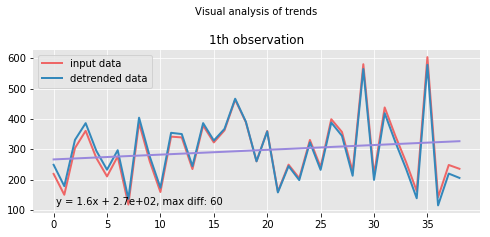

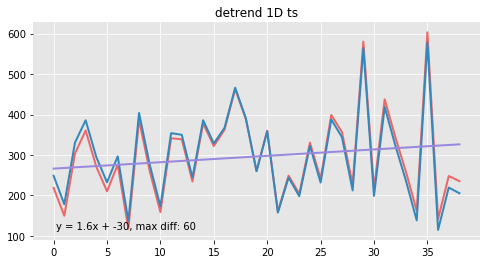

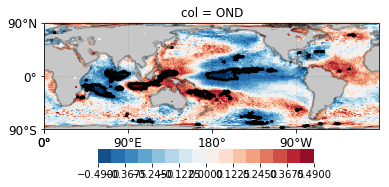

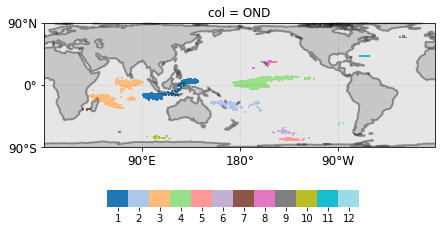

In [93]:
rg_gaza_ndj1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 2 months lead time (SON)

In [41]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('01-01', '11-01')  

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
C:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
C:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 11, 11, 11] regions in total (list of different splits)


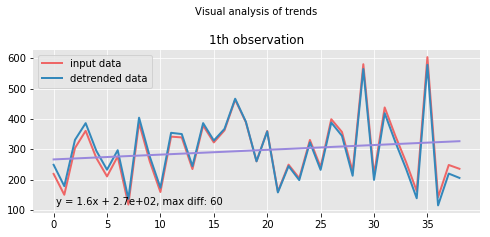

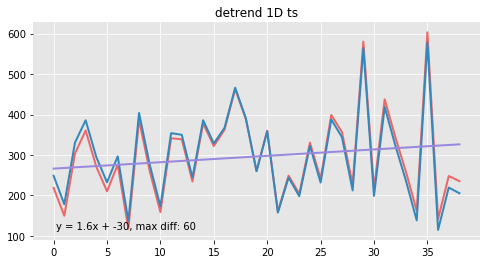

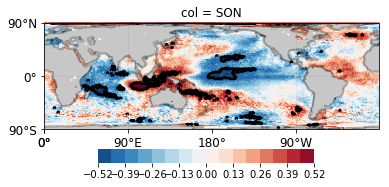

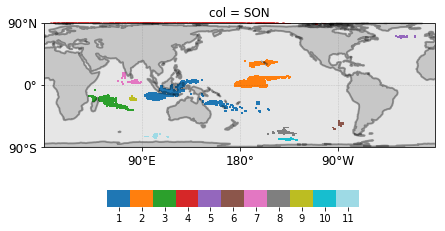

In [44]:
rg_gaza_ndj2 = pipeline.pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

In [50]:
auc_rg_gaza_ndj2, bss_rg_gaza_ndj2 = pred(rg_gaza_ndj2)

LogisticRegression 
 Test score
 BSS 0.31
 AUC 0.85 
Train score
 BSS 0.86
 AUC 0.99


In [103]:
print(pred_tuple[0].head())

              RV1rainfall         0
0 1982-01-01            0  0.550682
  1983-01-01            0  0.008276
  1984-01-01            0  0.181814
  1985-01-01            1  0.721512
  1986-01-01            0  0.376864


In [104]:
print(pred_tuple[1])

Coefficients            0
0  SON..1..sst  -0.114059
   SON..2..sst  -0.335056
   SON..3..sst  -0.161451
   SON..4..sst   0.432598
   SON..5..sst   1.350406
...                   ...
38 SON..7..sst  -1.730505
   SON..8..sst  -2.461793
   SON..9..sst  -1.146500
   SON..10..sst  1.707082
   SON..11..sst -0.979481

[428 rows x 1 columns]


In [107]:
pred_tuple[2]

{'lag_0': {'split_0': GridSearchCV(cv=PredefinedSplit(test_fold=array([4, 4, 8, 6, 1, 8, 3, 5, 6, 7, 3, 7, 1, 5, 0, 0, 6, 1, 7, 7, 2, 2,
         8, 0, 5, 6, 0, 5, 4, 9, 2, 9, 3, 2, 9, 4, 3, 1])),
               estimator=LogisticRegression(),
               param_grid={'C': [0.001, 0.1, 1, 5, 10, 20, 30]},
               return_train_score=True, scoring='neg_brier_score'),
  'split_1': GridSearchCV(cv=PredefinedSplit(test_fold=array([4, 4, 8, 6, 1, 8, 3, 5, 6, 7, 3, 7, 1, 5, 0, 0, 6, 1, 7, 7, 2, 2,
         8, 0, 5, 6, 0, 5, 4, 9, 2, 9, 3, 2, 9, 4, 3, 1])),
               estimator=LogisticRegression(),
               param_grid={'C': [0.001, 0.1, 1, 5, 10, 20, 30]},
               return_train_score=True, scoring='neg_brier_score'),
  'split_2': GridSearchCV(cv=PredefinedSplit(test_fold=array([4, 4, 8, 6, 1, 8, 3, 5, 6, 7, 3, 7, 1, 5, 0, 0, 6, 1, 7, 7, 2, 2,
         8, 0, 5, 6, 0, 5, 4, 9, 2, 9, 3, 2, 9, 4, 3, 1])),
               estimator=LogisticRegression(),
               param

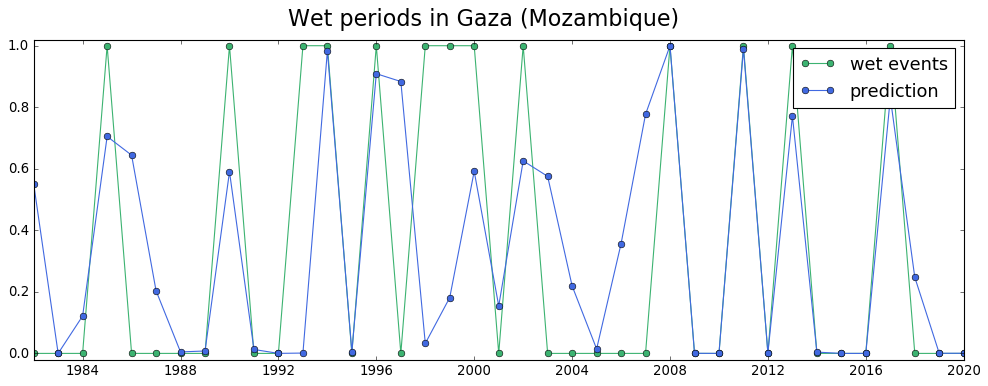

In [94]:
pred_tuple = rg_gaza_ndj2.pred_tuple
predict = pred_tuple[0]
predict_oos = functions_pp.get_df_test(predict, df_splits=rg_gaza_ndj2.df_splits) # Returns test data (only the data at which TrainIsTrue==False)
#plt.rcParams['']
#plt.style.use('classic')
plt.rcParams['axes.facecolor'] = 'white'
fig, ax = plt.subplots(1, figsize=(15,5))
fig.patch.set_facecolor('xkcd:white')
ax.plot_date(predict_oos.index, predict_oos.iloc[:,0], linestyle='solid', color='mediumseagreen', label='wet events')
ax.plot_date(predict_oos.index, predict_oos.iloc[:,1], linestyle='solid', color='royalblue', label='prediction')
ax.legend(fontsize=16)
ax.set_ylim(-0.02, 1.02)
filename = os.path.join(rg_gaza_ndj2.path_outsub1, 'prediction_timeseries.pdf')
fig.suptitle('Wet periods in Gaza (Mozambique)', size = 20)
fig.savefig(filename, bbox_inches='tight')

In [73]:
filename

'C:\\Users\\alicj\\Desktop\\WORK\\out\\1rainfall_aggr_01-01-11-01_sst_leave_1s1\\prediction_timeseries.pdf'

In [38]:
rg_gaza_ndj2.df_data[['1rainfall']]

1rainfall
0  1982-01-01  248.704998
   1983-01-01  178.363841
   1984-01-01  330.684787
   1985-01-01  385.860297
   1986-01-01  294.725092
...                   ...
38 2016-01-01  138.436217
   2017-01-01  578.106767
   2018-01-01  114.929697
   2019-01-01  219.676635
   2020-01-01  205.477740

[1521 rows x 1 columns]

In [22]:
core_pp.import_ds_lazy(TV_path)

<xarray.DataArray 'rainfall' (time: 39)>
array([218.691667, 149.930159, 303.830754, 360.585913, 271.030357, 210.381349,
       276.206151, 117.73373 , 386.512103, 260.226389, 158.994841, 341.408929,
       338.890476, 234.609722, 378.075794, 322.298214, 362.203175, 463.133135,
       389.15873 , 260.147619, 360.057143, 160.760913, 249.144841, 204.523611,
       330.424008, 241.406548, 398.840873, 356.749603, 226.82123 , 580.028373,
       216.351587, 437.585119, 344.01627 , 257.765675, 162.130952, 603.381151,
       141.78373 , 248.110317, 235.491071])
Coordinates:
  * time     (time) datetime64[ns] 1982-01-01 1983-01-01 ... 2020-01-01

In [39]:
gaza_ndj_data.index.name = None

In [ ]:
# another way of retrieving predicted values
# functions_pp.get_df_test(rg.df_data).iloc[:,0]

In [44]:
gaza_ndj_data.to_csv(os.path.join(data_path, 'gaza_ndj_observed.csv'))

In [45]:
rg_gaza_ndj2.TV.RV_ts.to_csv(os.path.join(data_path, 'gaza_ndj_predicted.csv'))

In [15]:
rg_gaza_ndj2.df_data.iloc[:,-2:]

TrainIsTrue  RV_mask
0  1982-01-01        False     True
   1983-01-01         True     True
   1984-01-01         True     True
   1985-01-01         True     True
   1986-01-01         True     True
...                    ...      ...
38 2016-01-01         True     True
   2017-01-01         True     True
   2018-01-01         True     True
   2019-01-01         True     True
   2020-01-01        False     True

[1521 rows x 2 columns]

### 3 months lead time (ASO)

In [96]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('01-01', '11-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7] regions in total (list of different splits)


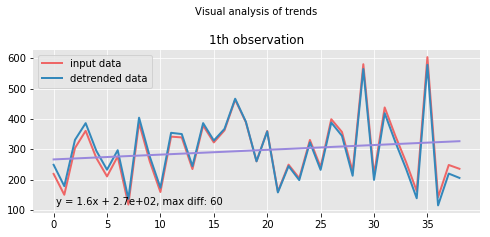

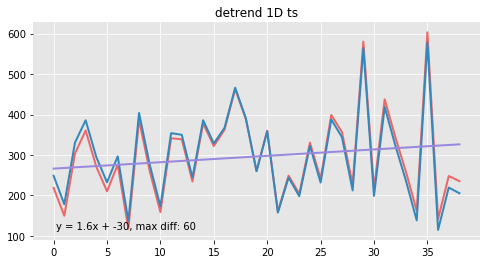

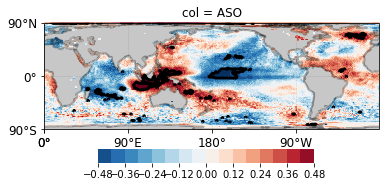

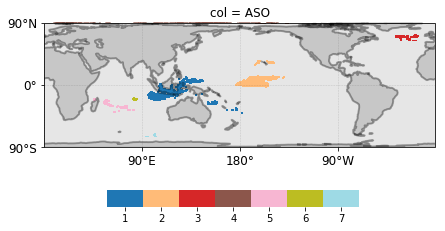

In [97]:
rg_gaza_ndj3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 4 months lead time (JAS)

In [98]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('01-01', '11-01')

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7] regions in total (list of different splits)


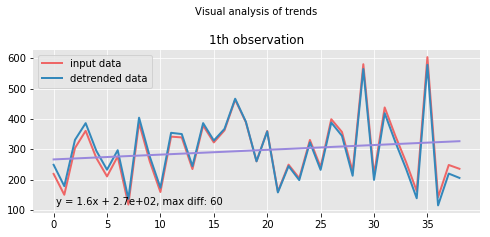

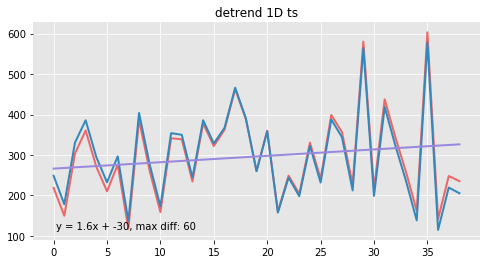

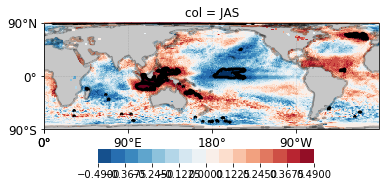

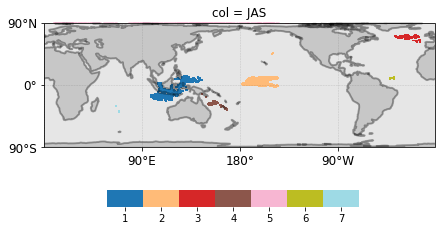

In [99]:
rg_gaza_ndj4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 5 months lead time (JJA)

In [100]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['06-01', '08-01']])            
periodnames = ['JJA']                                         
start_end_TVdate = ('01-01', '11-01')   

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('06-01', '08-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JJA
Plotting Corr maps sst_labels_init, split 0, lag JJA

Getting MI timeseries
There are [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6] regions in total (list of different splits)


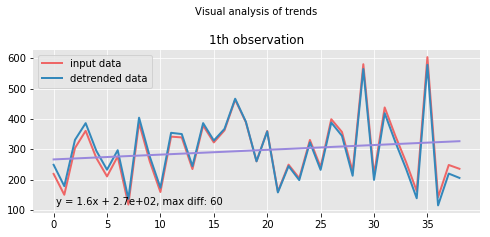

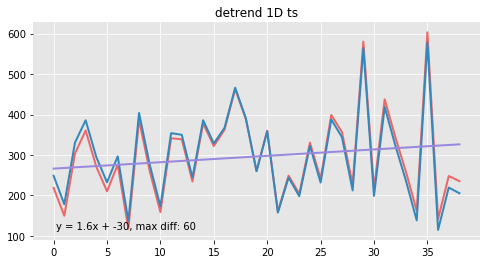

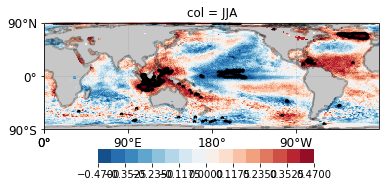

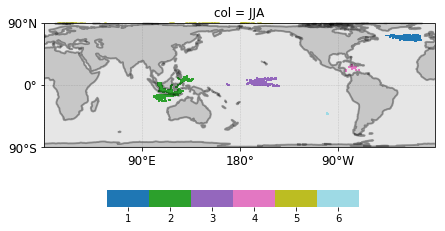

In [101]:
rg_gaza_ndj5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 6 months lead time (MJJ)

In [102]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['05-01', '07-01']])            
periodnames = ['MJJ']                                         
start_end_TVdate = ('01-01', '11-01')  

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('05-01', '07-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag MJJ
Plotting Corr maps sst_labels_init, split 0, lag MJJ

Getting MI timeseries
There are [4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4] regions in total (list of different splits)


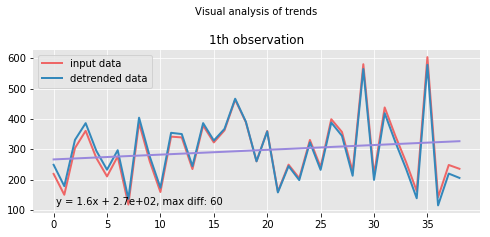

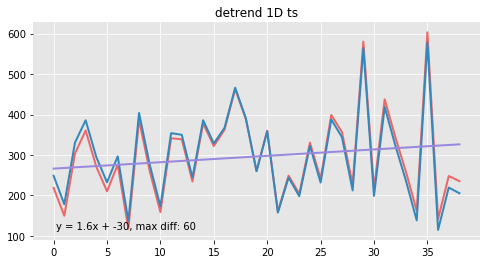

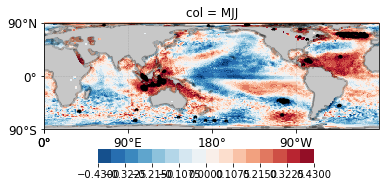

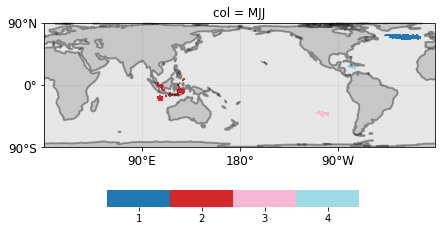

In [103]:
rg_gaza_ndj6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### DJF

In [104]:
gaza_djf = coordinates(data_djf, [31.30631, 34.47342], [-25.38095, -21.30902])
gaza_djf.head()

,V1,V2,1982,1983,1984,1985,1986,1987,1988,1989,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
37264,31.325,-21.325,184,132,216,450,221,235,391,174,...,522,224,316,370,230,125,720,394,271,360
37265,31.375,-21.325,165,121,201,401,195,206,342,152,...,470,204,288,344,208,117,671,336,244,319
37266,31.425,-21.325,121,103,161,335,181,175,254,112,...,379,177,230,280,170,94,521,241,182,241
37267,31.475,-21.325,98,90,127,270,155,142,248,105,...,320,157,175,219,149,75,399,185,143,176
37268,31.525,-21.325,94,92,125,260,154,139,245,101,...,310,157,166,212,146,71,385,182,147,169


In [105]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for DJF per year
gaza_djf_data = data_steps(gaza_djf, 'rainfall') 
gaza_djf_data.head()

,rainfall
index,
1982-01-01,240.440278
1983-01-01,182.785317
1984-01-01,302.030952
1985-01-01,406.112897
1986-01-01,251.088095


In [106]:
xarray(gaza_djf_data).to_netcdf(os.path.join(data_path, 'gaza_djf_aggr.nc'))

In [107]:
# directory of target variable data
TV_path = os.path.join(data_path, 'gaza_djf_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

### 1 month lead time (NDJ)

In [108]:
start_end_year = (1981, 2020)
start_end_TVyear = (1982, 2020)

lags = np.array([['11-01', '01-01']])            
periodnames = ['NDJ']                                         
start_end_TVdate = ('02-01', '12-01')   

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('11-01', '01-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag NDJ
Plotting Corr maps sst_labels_init, split 0, lag NDJ

Getting MI timeseries
There are [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 11, 11, 11, 11, 11, 11, 7, 9, 11, 11, 11, 11, 11, 11, 11, 11, 11, 9, 11, 11, 11, 11, 11, 10, 9, 11, 11, 11] regions in total (list of different splits)


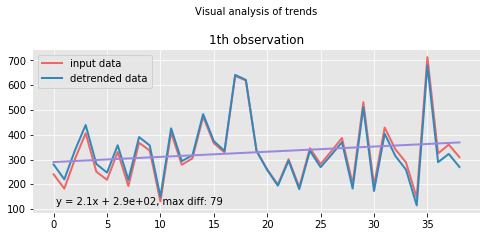

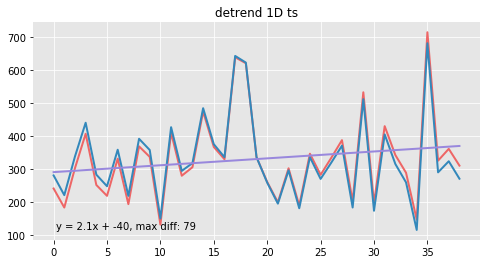

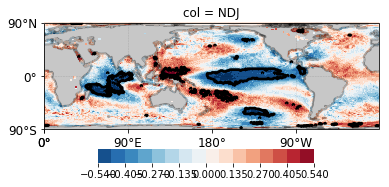

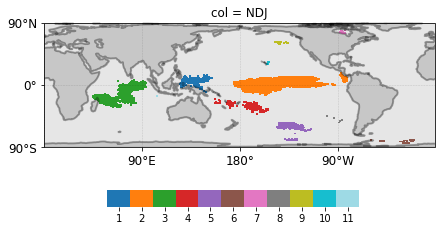

In [109]:
rg_gaza_djf1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 2 months lead time (OND)

In [110]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['OND']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag OND
Plotting Corr maps sst_labels_init, split 0, lag OND

Getting MI timeseries
There are [12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 9, 9, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12] regions in total (list of different splits)


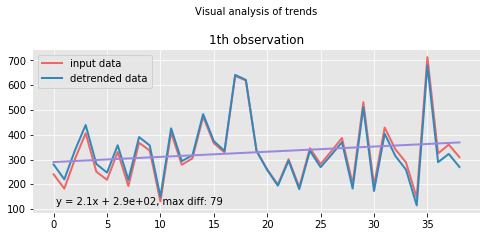

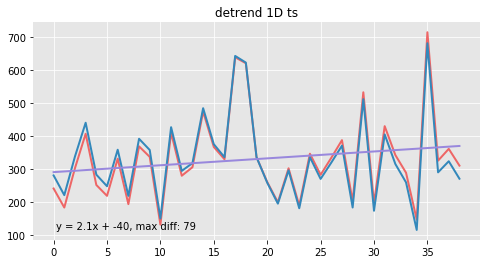

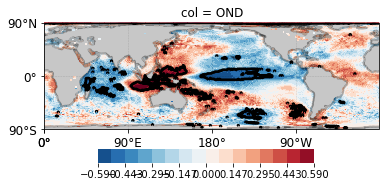

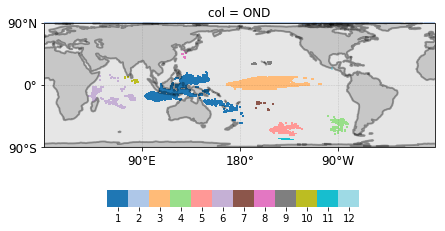

In [111]:
rg_gaza_djf2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 3 months lead time (SON)

In [112]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('02-01', '12-01')  

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 9, 9, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12] regions in total (list of different splits)


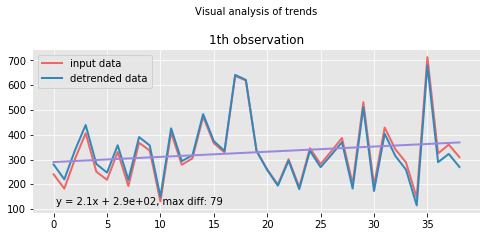

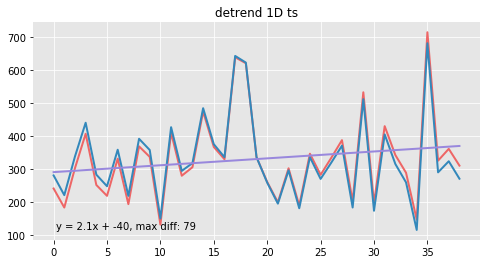

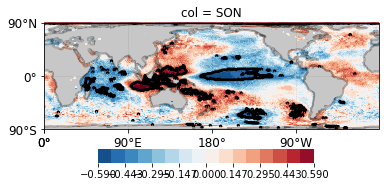

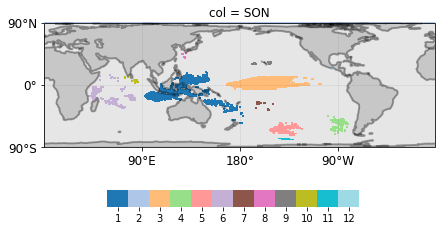

In [113]:
rg_gaza_djf3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 4 months lead time (ASO)

In [114]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('02-01', '12-01') 

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 11, 11, 11, 11, 11, 11, 8, 8, 11, 11, 11, 11, 10, 11, 11, 11, 11, 11, 10, 11, 11, 11, 11, 9, 9, 11, 11, 11] regions in total (list of different splits)


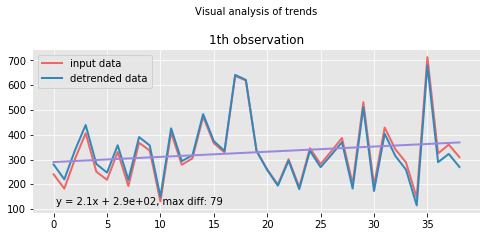

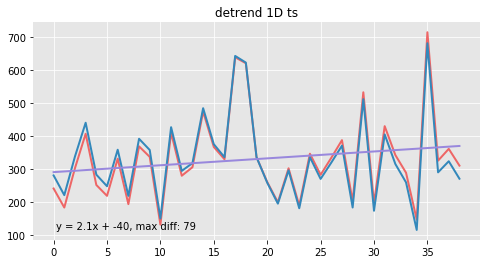

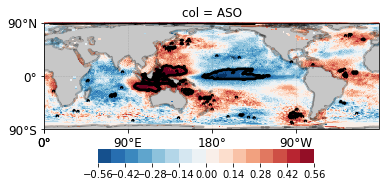

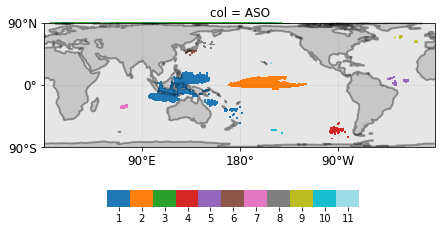

In [115]:
rg_gaza_djf4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 5 months lead time (JAS)

In [116]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)


lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('02-01', '12-01') 

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 11, 11, 11, 11, 11, 11, 9, 9, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 11, 11, 11, 11, 11, 9, 11, 11, 11] regions in total (list of different splits)


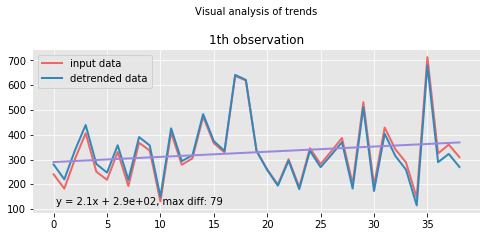

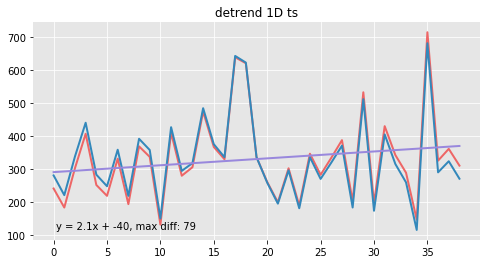

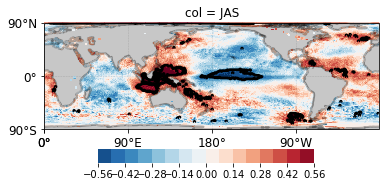

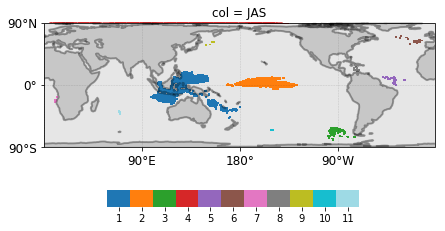

In [117]:
rg_gaza_djf5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 6 months lead time (JJA)

In [118]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['06-01', '08-01']])            
periodnames = ['JJA']                                         
start_end_TVdate = ('02-01', '12-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('06-01', '08-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JJA
Plotting Corr maps sst_labels_init, split 0, lag JJA

Getting MI timeseries
There are [10, 9, 9, 9, 9, 9, 10, 10, 9, 10, 10, 10, 9, 10, 9, 9, 10, 7, 9, 10, 9, 10, 10, 9, 10, 10, 10, 9, 9, 9, 9, 10, 10, 9, 9, 8, 9, 9, 10] regions in total (list of different splits)


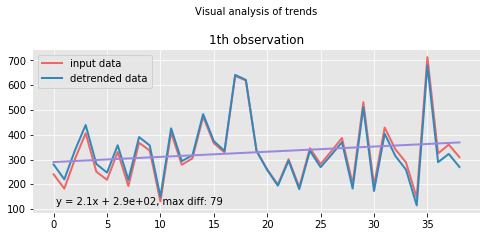

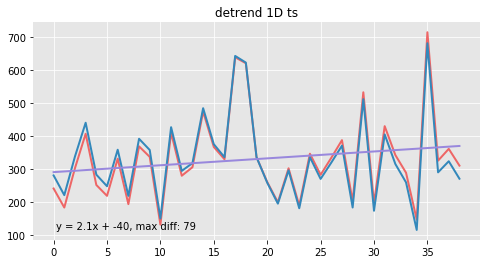

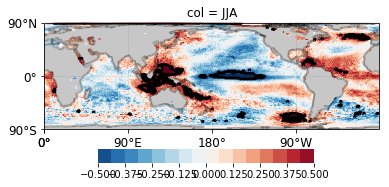

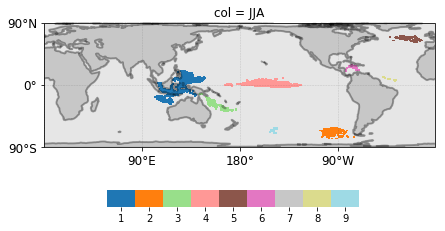

In [119]:
rg_gaza_djf6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### JFM

In [120]:
gaza_jfm = coordinates(data_jfm, [31.30631, 34.47342], [-25.38095, -21.30902])
gaza_jfm.head()

,V1,V2,1981,1982,1983,1984,1985,1986,1987,1988,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
37264,31.325,-21.325,321,174,128,263,369,189,184,268,...,320,125,302,399,174,272,571,393,227,308
37265,31.375,-21.325,288,157,116,236,324,169,159,226,...,286,119,275,377,148,247,524,333,204,275
37266,31.425,-21.325,203,109,84,162,233,121,102,141,...,206,83,206,275,100,179,364,228,137,194
37267,31.475,-21.325,146,90,51,109,164,86,70,98,...,146,59,149,189,69,124,244,164,97,130
37268,31.525,-21.325,145,85,48,92,148,78,64,83,...,127,54,135,170,59,99,226,158,97,124


In [121]:
# note that year-01-01 is just a naming convention, each entry contains aggregated value for JFM per year
gaza_jfm_data = data_steps(gaza_jfm, 'rainfall') 
gaza_jfm_data.head()

,rainfall
index,
1981-01-01,374.074603
1982-01-01,206.517460
1983-01-01,171.523016
1984-01-01,304.486310
1985-01-01,372.125992


In [122]:
xarray(gaza_jfm_data).to_netcdf(os.path.join(data_path, 'gaza_jfm_aggr.nc'))

In [123]:
# directory of target variable data
TV_path = os.path.join(data_path, 'gaza_jfm_aggr.nc')

# directory of precursor data
prec_path = os.path.join(data_path,'sst_1950-2020_1_12_monthly_1.0deg.nc')

# directory for test data 
path_test = os.path.join(my_main_dir, 'test')

# directory for output
output_path = os.path.join(my_main_dir, 'out')

list_of_name_path = [(1, TV_path), ('sst', prec_path)]

### 1 month lead time (DJF)

In [124]:
start_end_year = (1981, 2020)
start_end_TVyear = (1982, 2020)

lags = np.array([['12-01', '02-01']])            
periodnames = ['DJF']                                         
start_end_TVdate = ('01-01', '03-01')  

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('12-01', '02-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag DJF
Plotting Corr maps sst_labels_init, split 0, lag DJF

Getting MI timeseries
There are [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5] regions in total (list of different splits)


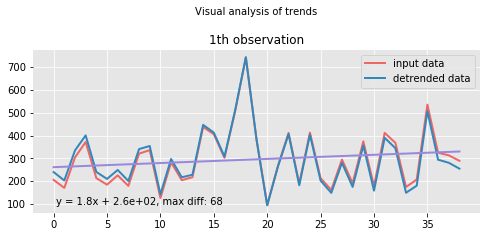

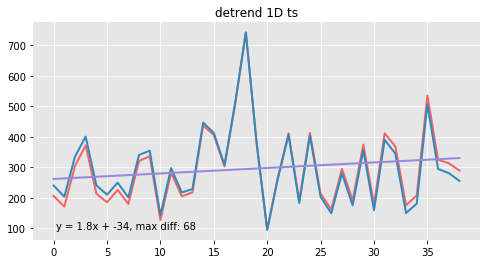

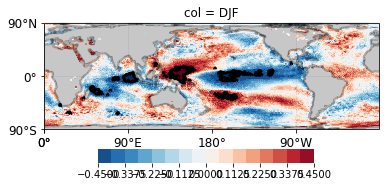

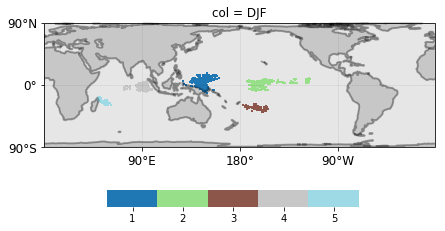

In [125]:
rg_gaza_jfm1 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 2 months lead time (NDJ)

In [126]:
start_end_year = (1981, 2020)
start_end_TVyear = (1982, 2020)

lags = np.array([['11-01', '01-01']])            
periodnames = ['NDJ']                                         
start_end_TVdate = ('01-01', '03-01')    

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2020] ('11-01', '01-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag NDJ
Plotting Corr maps sst_labels_init, split 0, lag NDJ

Getting MI timeseries
There are [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 8, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 9, 8, 9, 9, 9] regions in total (list of different splits)


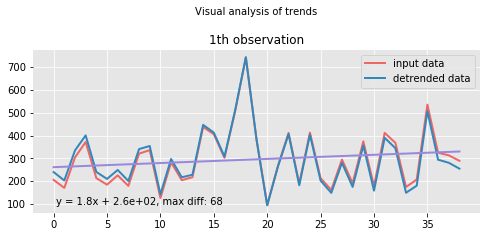

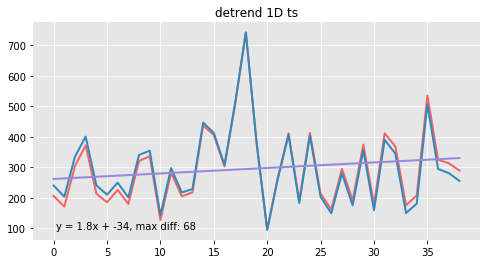

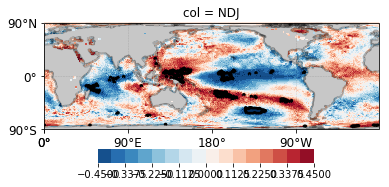

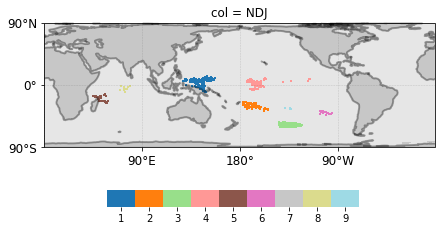

In [127]:
rg_gaza_jfm2 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 3 months lead time (OND)

In [128]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['10-01', '12-01']])            
periodnames = ['OND']                                         
start_end_TVdate = ('01-01', '03-01')  

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('10-01', '12-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag OND
Plotting Corr maps sst_labels_init, split 0, lag OND

Getting MI timeseries
There are [11, 10, 11, 11, 11, 11, 11, 12, 11, 11, 9, 12, 11, 11, 11, 11, 11, 9, 9, 11, 12, 11, 12, 10, 10, 10, 12, 11, 10, 12, 11, 12, 11, 10, 12, 10, 12, 12, 12] regions in total (list of different splits)


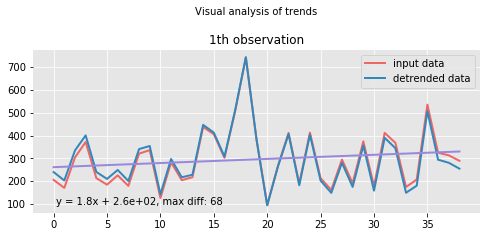

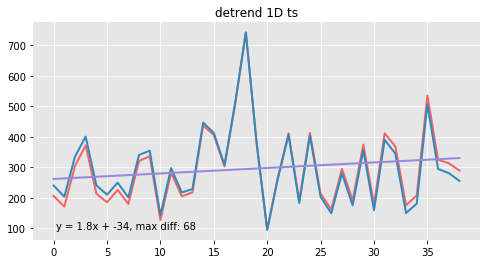

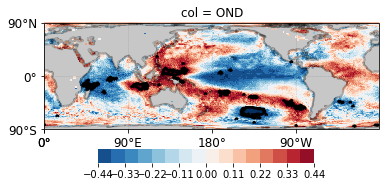

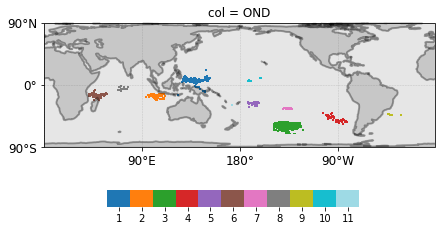

In [129]:
rg_gaza_jfm3 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 4 months lead time (SON)

In [130]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['09-01', '11-01']])            
periodnames = ['SON']                                         
start_end_TVdate = ('01-01', '03-01') 

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('09-01', '11-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag SON
Plotting Corr maps sst_labels_init, split 0, lag SON

Getting MI timeseries
There are [9, 8, 9, 8, 9, 8, 9, 9, 9, 9, 7, 9, 8, 8, 9, 9, 9, 5, 6, 8, 9, 9, 9, 8, 9, 8, 9, 9, 8, 9, 9, 9, 9, 8, 8, 7, 9, 9, 9] regions in total (list of different splits)


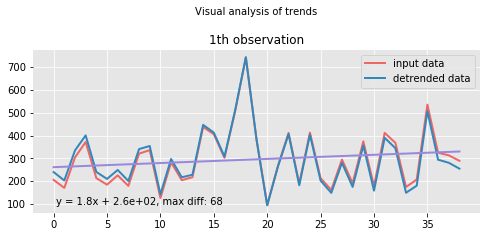

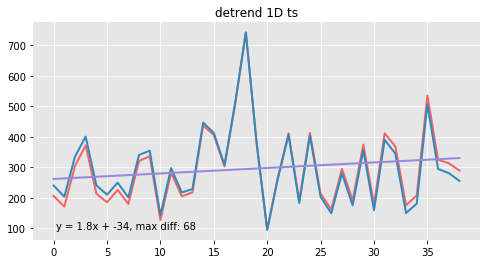

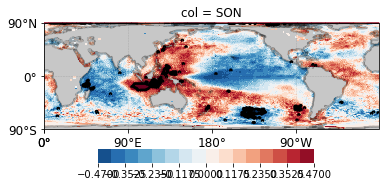

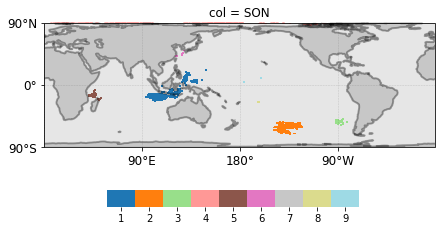

In [131]:
rg_gaza_jfm4 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 5 months lead time (ASO)

In [132]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['08-01', '10-01']])            
periodnames = ['ASO']                                         
start_end_TVdate = ('01-01', '03-01') 

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('08-01', '10-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag ASO
Plotting Corr maps sst_labels_init, split 0, lag ASO

Getting MI timeseries
There are [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7, 6, 7, 7, 5, 5, 7, 7, 7, 7, 6, 7, 6, 7, 7, 6, 7, 7, 7, 7, 7, 7, 6, 7, 7, 7] regions in total (list of different splits)


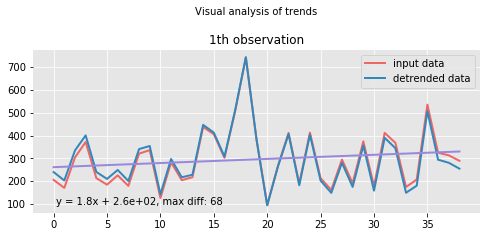

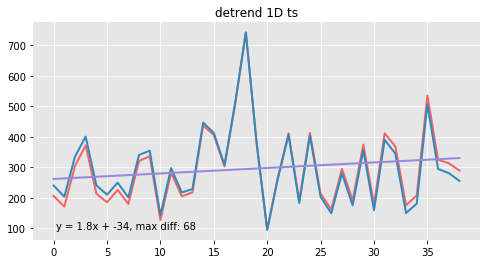

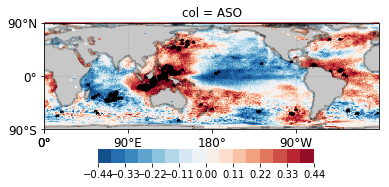

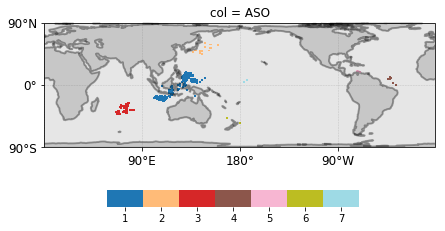

In [133]:
rg_gaza_jfm5 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

### 6 months lead time (JAS)

In [134]:
start_end_year = (1981, 2019)
start_end_TVyear = (1982, 2020)

lags = np.array([['07-01', '09-01']])            
periodnames = ['JAS']                                         
start_end_TVdate = ('01-01', '03-01')  

Start linear detrending ...
Done
Visual test on 0th observationDetected timeseries with annual mean values
tfreq is None, no common time aggregation used, loading annual mean data
Loaded pre-processed data of sst

[1981 2019] ('07-01', '09-01')

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(38dp, 97%)



C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\xarray\core\computation.py:724: RuntimeWarning: invalid value encountered in sign
  result_data = func(*input_data)
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False
c:\Users\alicj\Documents\GitHub\RGCPD\RGCPD\find_precursors.py:98: RuntimeWarning: invalid value encountered in sign
  mask[np.sign(data) != sign] = False


Plotting Corr maps sst, split 0, lag JAS
Plotting Corr maps sst_labels_init, split 0, lag JAS

Getting MI timeseries
There are [7, 6, 7, 6, 7, 7, 7, 6, 7, 7, 7, 7, 7, 7, 6, 7, 7, 4, 6, 7, 7, 7, 7, 7, 6, 7, 6, 7, 6, 7, 6, 7, 7, 7, 6, 5, 7, 7, 7] regions in total (list of different splits)


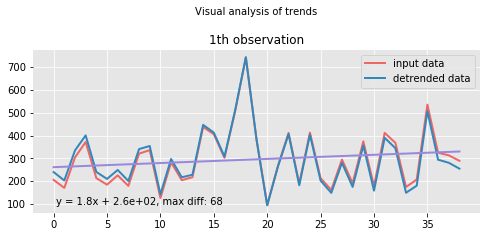

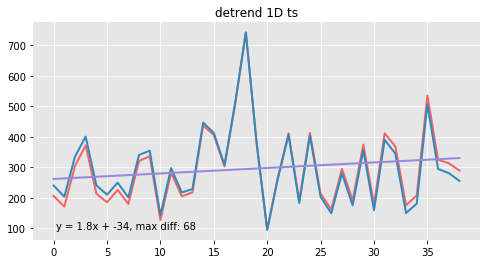

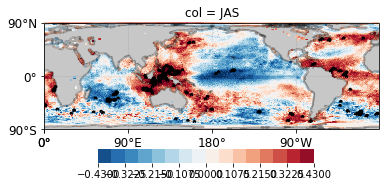

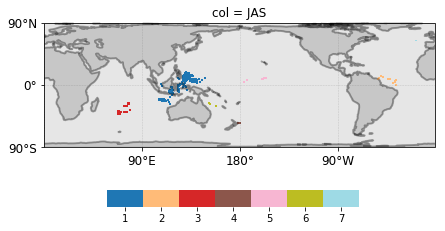

In [135]:
rg_gaza_jfm6 = pipeline(list_of_name_path, output_path, function, alpha, FDR_control, distance_eps, min_area_in_degrees2, tfreq, start_end_year, 
             start_end_TVyear, TVdates_aggr, ext_annual_to_mon, method, detrend, labels, pred_type, q, lags, periodnames, start_end_TVdate, name)

## Calculating AUC's & BSS

## TETE

### Tete 1 month lead time 

In [136]:
auc_rg_tete_ond1, bss_rg_tete_ond1 = pred(rg_tete_ond1)

LogisticRegressionCV 
 Test score
 BSS 0.07
 AUC 0.67 
Train score
 BSS 0.27
 AUC 0.82


In [137]:
auc_rg_tete_ndj1, bss_rg_tete_ndj1 = pred(rg_tete_ndj1)

C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    

LogisticRegressionCV 
 Test score
 BSS -0.02
 AUC 0.67 
Train score
 BSS 0.39
 AUC 0.89


In [138]:
auc_rg_tete_djf1, bss_rg_tete_djf1 = pred(rg_tete_djf1)

LogisticRegressionCV 
 Test score
 BSS 0.02
 AUC 0.65 
Train score
 BSS 0.28
 AUC 0.85


In [139]:
auc_rg_tete_jfm1, bss_rg_tete_jfm1 = pred(rg_tete_jfm1)

LogisticRegressionCV 
 Test score
 BSS -0.18
 AUC 0.53 
Train score
 BSS 0.34
 AUC 0.84


### Tete 2 month lead time

In [140]:
auc_rg_tete_ond2, bss_rg_tete_ond2 = pred(rg_tete_ond2)

LogisticRegressionCV 
 Test score
 BSS 0.08
 AUC 0.67 
Train score
 BSS 0.28
 AUC 0.81


In [141]:
auc_rg_tete_ndj2, bss_rg_tete_ndj2 = pred(rg_tete_ndj2)

LogisticRegressionCV 
 Test score
 BSS 0.29
 AUC 0.82 
Train score
 BSS 0.65
 AUC 0.97


In [142]:
auc_rg_tete_djf2, bss_rg_tete_djf2 = pred(rg_tete_djf2)

LogisticRegressionCV 
 Test score
 BSS -0.06
 AUC 0.63 
Train score
 BSS 0.31
 AUC 0.85


In [143]:
auc_rg_tete_jfm2, bss_rg_tete_jfm2 = pred(rg_tete_jfm2)

C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegressionCV 
 Test score
 BSS -0.00
 AUC 0.58 
Train score
 BSS 0.40
 AUC 0.87


### Tete 3 months lead time 

In [144]:
auc_rg_tete_ond3, bss_rg_tete_ond3 = pred(rg_tete_ond3)

auc_rg_tete_ndj3, bss_rg_tete_ndj3 = pred(rg_tete_ndj3)

auc_rg_tete_djf3, bss_rg_tete_djf3 = pred(rg_tete_djf3)

auc_rg_tete_jfm3, bss_rg_tete_jfm3 = pred(rg_tete_jfm3)

LogisticRegressionCV 
 Test score
 BSS -0.00
 AUC 0.62 
Train score
 BSS 0.20
 AUC 0.75
LogisticRegressionCV 
 Test score
 BSS 0.12
 AUC 0.70 
Train score
 BSS 0.42
 AUC 0.88
LogisticRegressionCV 
 Test score
 BSS 0.25
 AUC 0.80 
Train score
 BSS 0.56
 AUC 0.94
LogisticRegressionCV 
 Test score
 BSS -0.05
 AUC 0.56 
Train score
 BSS 0.35
 AUC 0.83


### Tete 4 months lead time

In [145]:
auc_rg_tete_ond4, bss_rg_tete_ond4 = pred(rg_tete_ond4)

auc_rg_tete_ndj4, bss_rg_tete_ndj4 = pred(rg_tete_ndj4)

auc_rg_tete_djf4, bss_rg_tete_djf4 = pred(rg_tete_djf4)

auc_rg_tete_jfm4, bss_rg_tete_jfm4 = pred(rg_tete_jfm4)

LogisticRegressionCV 
 Test score
 BSS 0.07
 AUC 0.65 
Train score
 BSS 0.20
 AUC 0.74
LogisticRegressionCV 
 Test score
 BSS 0.07
 AUC 0.67 
Train score
 BSS 0.41
 AUC 0.88
LogisticRegressionCV 
 Test score
 BSS 0.24
 AUC 0.76 
Train score
 BSS 0.68
 AUC 0.98
LogisticRegressionCV 
 Test score
 BSS -0.06
 AUC 0.46 
Train score
 BSS 0.33
 AUC 0.84


### Tete 5 months lead time

In [146]:
auc_rg_tete_ond5, bss_rg_tete_ond5 = pred(rg_tete_ond5)

auc_rg_tete_ndj5, bss_rg_tete_ndj5 = pred(rg_tete_ndj5)

auc_rg_tete_djf5, bss_rg_tete_djf5 = pred(rg_tete_djf5)

auc_rg_tete_jfm5, bss_rg_tete_jfm5 = pred(rg_tete_jfm5)

LogisticRegressionCV 
 Test score
 BSS -0.07
 AUC 0.59 
Train score
 BSS 0.29
 AUC 0.79
LogisticRegressionCV 
 Test score
 BSS -0.15
 AUC 0.66 
Train score
 BSS 0.62
 AUC 0.95
LogisticRegressionCV 
 Test score
 BSS 0.28
 AUC 0.82 
Train score
 BSS 0.65
 AUC 0.96
LogisticRegressionCV 
 Test score
 BSS 0.05
 AUC 0.62 
Train score
 BSS 0.35
 AUC 0.87


### Tete 6 months lead time

In [163]:
#auc_rg_tete_ond6, bss_rg_tete_ond6 = pred(rg_tete_ond6)

auc_rg_tete_ond6, bss_rg_tete_ond6 = [0, 0]

auc_rg_tete_ndj6, bss_rg_tete_ndj6 = pred(rg_tete_ndj6)

auc_rg_tete_djf6, bss_rg_tete_djf6 = pred(rg_tete_djf6)

auc_rg_tete_jfm6, bss_rg_tete_jfm6 = pred(rg_tete_jfm6)

LogisticRegressionCV 
 Test score
 BSS 0.25
 AUC 0.72 
Train score
 BSS 0.87
 AUC 1.00
LogisticRegressionCV 
 Test score
 BSS 0.10
 AUC 0.75 
Train score
 BSS 0.40
 AUC 0.89
LogisticRegressionCV 
 Test score
 BSS 0.02
 AUC 0.62 
Train score
 BSS 0.46
 AUC 0.88


## GAZA

### Gaza 1 month lead time

In [147]:
auc_rg_gaza_ond1, bss_rg_gaza_ond1 = pred(rg_gaza_ond1)

LogisticRegressionCV 
 Test score
 BSS 0.10
 AUC 0.73 
Train score
 BSS 0.47
 AUC 0.90


In [148]:
auc_rg_gaza_ndj1, bss_rg_gaza_ndj1 = pred(rg_gaza_ndj1)

C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    

LogisticRegressionCV 
 Test score
 BSS 0.02
 AUC 0.67 
Train score
 BSS 0.42
 AUC 0.91


In [149]:
auc_rg_gaza_djf1, bss_rg_gaza_djf1 = pred(rg_gaza_djf1)

LogisticRegressionCV 
 Test score
 BSS -0.06
 AUC 0.60 
Train score
 BSS 0.34
 AUC 0.86


In [150]:
auc_rg_gaza_jfm1, bss_rg_gaza_jfm1 = pred(rg_gaza_jfm1)

LogisticRegressionCV 
 Test score
 BSS 0.24
 AUC 0.76 
Train score
 BSS 0.48
 AUC 0.89


### Gaza 2 month lead time

In [151]:
auc_rg_gaza_ond2, bss_rg_gaza_ond2 = pred(rg_gaza_ond2)

LogisticRegressionCV 
 Test score
 BSS 0.03
 AUC 0.66 
Train score
 BSS 0.49
 AUC 0.91


In [152]:
auc_rg_gaza_ndj2, bss_rg_gaza_ndj2 = pred(rg_gaza_ndj2)

LogisticRegressionCV 
 Test score
 BSS 0.33
 AUC 0.86 
Train score
 BSS 0.84
 AUC 0.99


In [153]:
auc_rg_gaza_djf2, bss_rg_gaza_djf2 = pred(rg_gaza_djf2)

LogisticRegressionCV 
 Test score
 BSS -0.26
 AUC 0.59 
Train score
 BSS 0.48
 AUC 0.90


In [154]:
auc_rg_gaza_jfm2, bss_rg_gaza_jfm2 = pred(rg_gaza_jfm2)

LogisticRegressionCV 
 Test score
 BSS 0.19
 AUC 0.69 
Train score
 BSS 0.43
 AUC 0.89


### Gaza 3 months lead time 

In [155]:
auc_rg_gaza_ond3, bss_rg_gaza_ond3 = pred(rg_gaza_ond3)

auc_rg_gaza_ndj3, bss_rg_gaza_ndj3 = pred(rg_gaza_ndj3)

auc_rg_gaza_djf3, bss_rg_gaza_djf3 = pred(rg_gaza_djf3)

auc_rg_gaza_jfm3, bss_rg_gaza_jfm3 = pred(rg_gaza_jfm3)

LogisticRegressionCV 
 Test score
 BSS 0.10
 AUC 0.71 
Train score
 BSS 0.38
 AUC 0.87
LogisticRegressionCV 
 Test score
 BSS 0.22
 AUC 0.78 
Train score
 BSS 0.50
 AUC 0.92
LogisticRegressionCV 
 Test score
 BSS -0.26
 AUC 0.59 
Train score
 BSS 0.48
 AUC 0.90
LogisticRegressionCV 
 Test score
 BSS 0.14
 AUC 0.73 
Train score
 BSS 0.68
 AUC 0.98


### Gaza 4 months lead time

In [156]:
auc_rg_gaza_ond4, bss_rg_gaza_ond4 = pred(rg_gaza_ond4)

auc_rg_gaza_ndj4, bss_rg_gaza_ndj4 = pred(rg_gaza_ndj4)

auc_rg_gaza_djf4, bss_rg_gaza_djf4 = pred(rg_gaza_djf4)

auc_rg_gaza_jfm4, bss_rg_gaza_jfm4 = pred(rg_gaza_jfm4)

LogisticRegressionCV 
 Test score
 BSS 0.16
 AUC 0.78 
Train score
 BSS 0.60
 AUC 0.96
LogisticRegressionCV 
 Test score
 BSS 0.14
 AUC 0.76 
Train score
 BSS 0.66
 AUC 0.97
LogisticRegressionCV 
 Test score
 BSS -0.01
 AUC 0.71 
Train score
 BSS 0.54
 AUC 0.94
LogisticRegressionCV 
 Test score
 BSS 0.22
 AUC 0.75 
Train score
 BSS 0.55
 AUC 0.96


### Gaza 5 months lead time

In [157]:
auc_rg_gaza_ond5, bss_rg_gaza_ond5 = pred(rg_gaza_ond5)

auc_rg_gaza_ndj5, bss_rg_gaza_ndj5 = pred(rg_gaza_ndj5)

auc_rg_gaza_djf5, bss_rg_gaza_djf5 = pred(rg_gaza_djf5)

auc_rg_gaza_jfm5, bss_rg_gaza_jfm5 = pred(rg_gaza_jfm5)

LogisticRegressionCV 
 Test score
 BSS 0.22
 AUC 0.83 
Train score
 BSS 0.72
 AUC 0.98
LogisticRegressionCV 
 Test score
 BSS 0.14
 AUC 0.71 
Train score
 BSS 0.42
 AUC 0.89


C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\alicj\AppData\Local\Continuum\anaconda3\envs\RGCPD\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    

LogisticRegressionCV 
 Test score
 BSS 0.04
 AUC 0.64 
Train score
 BSS 0.38
 AUC 0.87
LogisticRegressionCV 
 Test score
 BSS 0.22
 AUC 0.79 
Train score
 BSS 0.61
 AUC 0.95


### Gaza 6 months lead time

In [158]:
auc_rg_gaza_ond6, bss_rg_gaza_ond6 = pred(rg_gaza_ond6)

auc_rg_gaza_ndj6, bss_rg_gaza_ndj6 = pred(rg_gaza_ndj6)

auc_rg_gaza_djf6, bss_rg_gaza_djf6 = pred(rg_gaza_djf6)

auc_rg_gaza_jfm6, bss_rg_gaza_jfm6 = pred(rg_gaza_jfm6)

LogisticRegressionCV 
 Test score
 BSS -0.01
 AUC 0.71 
Train score
 BSS 0.74
 AUC 0.98
LogisticRegressionCV 
 Test score
 BSS 0.13
 AUC 0.72 
Train score
 BSS 0.49
 AUC 0.90
LogisticRegressionCV 
 Test score
 BSS -0.21
 AUC 0.61 
Train score
 BSS 0.51
 AUC 0.89
LogisticRegressionCV 
 Test score
 BSS 0.24
 AUC 0.83 
Train score
 BSS 0.62
 AUC 0.96


## AUC test scores

In [159]:
periods = ['OND', 'NDJ', 'DJF', 'JFM']
lead_time = [1, 2]

auc_tete = np.array([[auc_rg_tete_ond1, auc_rg_tete_ond2], [auc_rg_tete_ndj1, auc_rg_tete_ndj2], 
                     [auc_rg_tete_djf1, auc_rg_tete_djf2], [auc_rg_tete_jfm1, auc_rg_tete_jfm2]])   # AUC's

auc_gaza = np.array([[auc_rg_gaza_ond1, auc_rg_gaza_ond2], [auc_rg_gaza_ndj1, auc_rg_gaza_ndj2],
                     [auc_rg_gaza_djf1, auc_rg_gaza_djf2], [auc_rg_gaza_jfm1, auc_rg_gaza_jfm2]])

Text(0.5,0.98,'AUC')

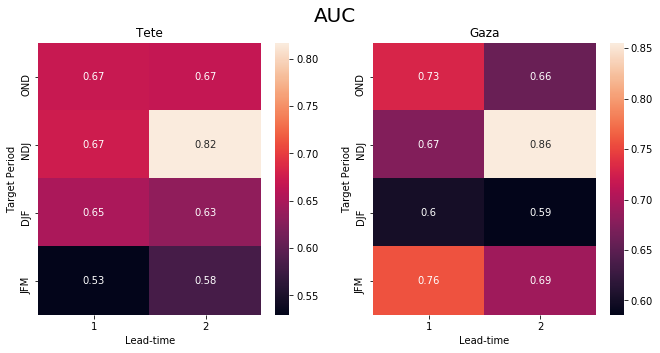

In [160]:
import seaborn as sns
import matplotlib.pylab as plt
  
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
a1 = sns.heatmap( auc_tete , xticklabels=lead_time, yticklabels=periods, ax = ax1, annot = True)
a1.set_title('Tete')
a1.set_xlabel('Lead-time')
a1.set_ylabel('Target Period')
a2 = sns.heatmap( auc_gaza , xticklabels=lead_time, yticklabels=periods, ax = ax2, annot = True)
a2.set_title('Gaza')
a2.set_xlabel('Lead-time')
a2.set_ylabel('Target Period')
fig.suptitle('AUC', size = 20)

In [175]:
periods = ['OND', 'NDJ', 'DJF', 'JFM']
lead_time = [1, 2, 3, 4, 5, 6]

auc_tete = np.array([[auc_rg_tete_ond1, auc_rg_tete_ond2, auc_rg_tete_ond3, auc_rg_tete_ond4, auc_rg_tete_ond5, auc_rg_tete_ond6],
                     [auc_rg_tete_ndj1, auc_rg_tete_ndj2, auc_rg_tete_ndj3, auc_rg_tete_ndj4, auc_rg_tete_ndj5, auc_rg_tete_ndj6], 
                     [auc_rg_tete_djf1, auc_rg_tete_djf2, auc_rg_tete_djf3, auc_rg_tete_djf4, auc_rg_tete_djf5, auc_rg_tete_djf6], 
                     [auc_rg_tete_jfm1, auc_rg_tete_jfm2, auc_rg_tete_jfm3, auc_rg_tete_jfm4, auc_rg_tete_jfm5, auc_rg_tete_jfm6]])   # AUC's

auc_gaza = np.array([[auc_rg_gaza_ond1, auc_rg_gaza_ond2, auc_rg_gaza_ond3, auc_rg_gaza_ond4, auc_rg_gaza_ond5, auc_rg_gaza_ond6], 
                     [auc_rg_gaza_ndj1, auc_rg_gaza_ndj2, auc_rg_gaza_ndj3, auc_rg_gaza_ndj4, auc_rg_gaza_ndj5, auc_rg_gaza_ndj6],
                     [auc_rg_gaza_djf1, auc_rg_gaza_djf2, auc_rg_gaza_djf3, auc_rg_gaza_djf4, auc_rg_gaza_djf5, auc_rg_gaza_djf6], 
                     [auc_rg_gaza_jfm1, auc_rg_gaza_jfm2, auc_rg_gaza_jfm3, auc_rg_gaza_jfm4, auc_rg_gaza_jfm5, auc_rg_gaza_jfm6]])

Text(0.5,0.98,'test AUC')

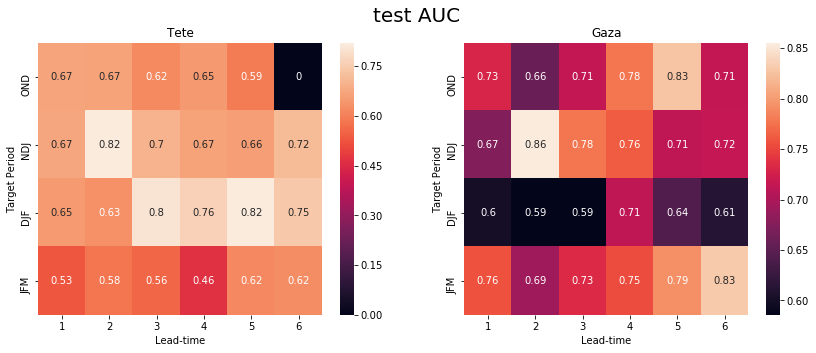

In [189]:
fig_auc, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
a1 = sns.heatmap( auc_tete , xticklabels=lead_time, yticklabels=periods, ax = ax1, annot = True)
a1.set_title('Tete')
a1.set_xlabel('Lead-time')
a1.set_ylabel('Target Period')
a2 = sns.heatmap( auc_gaza , xticklabels=lead_time, yticklabels=periods, ax = ax2, annot = True)
a2.set_title('Gaza')
a2.set_xlabel('Lead-time')
a2.set_ylabel('Target Period')
fig_auc.suptitle('test AUC', size = 20)

some observations:
- Tete OND average: 0.53 (0 for OND with 6 months lead time -> no significant precursor region found), NDJ average: 0.706, DFJ average: 0.735, JFM average: 0.562; best predictability for DJF

- Tete 1 month lead time average: 0.63, 2 months average: 0.675 , 3 months average: 0.67, 4 month average: 0.635, 5 months average: 0.673, 6 months average: 0.523; best AUC for 2, 3, 5 months lead time

- Gaza OND average: 0.737, NDJ average: 0.75, DJF average: 0.623, JFM average: 0.758; best predictability for NDJ

- Gaza 1 month lead time average: 0.69, 2 months average: 0.7, 3 months average: 0.703, 4 months average: 0.75, 5 months average: 0.743, 6 months average: 0.718; overall predictability comparable for all lead-times, best for 4, 5 months

- DJF: much better scores for Tete than for Gaza; the rest of target periods is generally better for Gaza

## BSS test

In [177]:
periods = ['OND', 'NDJ', 'DJF', 'JFM']
lead_time = [1, 2]

bss_tete = np.array([[bss_rg_tete_ond1, bss_rg_tete_ond2], [bss_rg_tete_ndj1, bss_rg_tete_ndj2], 
                     [bss_rg_tete_djf1, bss_rg_tete_djf2], [bss_rg_tete_jfm1, bss_rg_tete_jfm2]])   # AUC's

bss_gaza = np.array([[bss_rg_gaza_ond1, bss_rg_gaza_ond2], [bss_rg_gaza_ndj1, bss_rg_gaza_ndj2],
                     [bss_rg_gaza_djf1, bss_rg_gaza_djf2], [bss_rg_gaza_jfm1, bss_rg_gaza_jfm2]])

Text(0.5,0.98,'BSS')

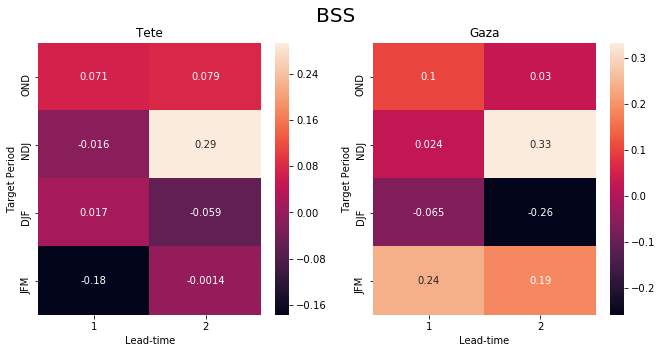

In [178]:
import seaborn as sns
import matplotlib.pylab as plt
  
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
a1 = sns.heatmap( bss_tete , xticklabels=lead_time, yticklabels=periods, ax = ax1, annot = True)
a1.set_title('Tete')
a1.set_xlabel('Lead-time')
a1.set_ylabel('Target Period')
a2 = sns.heatmap( bss_gaza , xticklabels=lead_time, yticklabels=periods, ax = ax2, annot = True)
a2.set_title('Gaza')
a2.set_xlabel('Lead-time')
a2.set_ylabel('Target Period')
fig.suptitle('BSS', size = 20)

In [179]:
periods = ['OND', 'NDJ', 'DJF', 'JFM']
lead_time = [1, 2, 3, 4, 5, 6]

bss_tete = np.array([[bss_rg_tete_ond1, bss_rg_tete_ond2, bss_rg_tete_ond3, bss_rg_tete_ond4, bss_rg_tete_ond5, bss_rg_tete_ond6],
                     [bss_rg_tete_ndj1, bss_rg_tete_ndj2, bss_rg_tete_ndj3, bss_rg_tete_ndj4, bss_rg_tete_ndj5, bss_rg_tete_ndj6], 
                     [bss_rg_tete_djf1, bss_rg_tete_djf2, bss_rg_tete_djf3, bss_rg_tete_djf4, bss_rg_tete_djf5, bss_rg_tete_djf6], 
                     [bss_rg_tete_jfm1, bss_rg_tete_jfm2, bss_rg_tete_jfm3, bss_rg_tete_jfm4, bss_rg_tete_jfm5, bss_rg_tete_jfm6]])   # AUC's

bss_gaza = np.array([[bss_rg_gaza_ond1, bss_rg_gaza_ond2, bss_rg_gaza_ond3, bss_rg_gaza_ond4, bss_rg_gaza_ond5, bss_rg_gaza_ond6], 
                     [bss_rg_gaza_ndj1, bss_rg_gaza_ndj2, bss_rg_gaza_ndj3, bss_rg_gaza_ndj4, bss_rg_gaza_ndj5, bss_rg_gaza_ndj6],
                     [bss_rg_gaza_djf1, bss_rg_gaza_djf2, bss_rg_gaza_djf3, bss_rg_gaza_djf4, bss_rg_gaza_djf5, bss_rg_gaza_djf6], 
                     [bss_rg_gaza_jfm1, bss_rg_gaza_jfm2, bss_rg_gaza_jfm3, bss_rg_gaza_jfm4, bss_rg_gaza_jfm5, bss_rg_gaza_jfm6]])

Text(0.5,0.98,'test BSS')

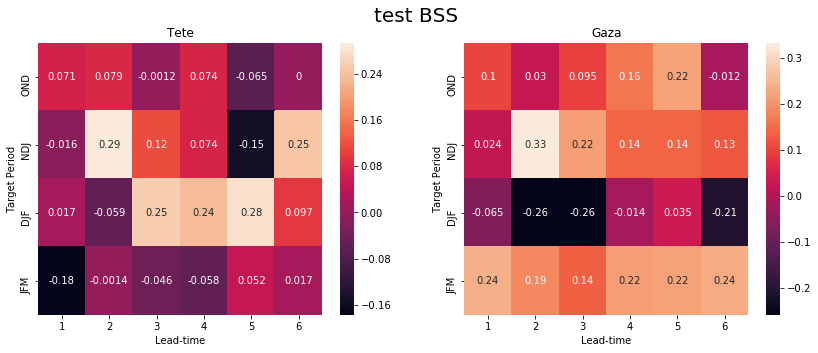

In [186]:
fig_bss, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
a1 = sns.heatmap( bss_tete , xticklabels=lead_time, yticklabels=periods, ax = ax1, annot = True)
a1.set_title('Tete')
a1.set_xlabel('Lead-time')
a1.set_ylabel('Target Period')
a2 = sns.heatmap( bss_gaza , xticklabels=lead_time, yticklabels=periods, ax = ax2, annot = True)
a2.set_title('Gaza')
a2.set_xlabel('Lead-time')
a2.set_ylabel('Target Period')
fig_bss.suptitle('test BSS', size = 20)

In [188]:
fig_bss.savefig('BSS 6 months leadtime.pdf', dpi = 300)

In [190]:
fig_auc.savefig('AUC 6 months leadtime.pdf', dpi = 300)

## Fixed figures

In [ ]:
periods = ['OND', 'NDJ', 'DJF', 'JFM']
lead_time = [1, 2, 3, 4, 5, 6]

In [ ]:
OND_tete = [0.67, 0.67, 0.62, 0.65, 0.59, 0]
NDJ_tete = [0.67, 0.82, 0.7, 0.67, 0.66, 0.72]
DJF_tete = [0.65, 0.63, 0.8, 0.76, 0.82, 0.75]
JFM_tete = [0.53, 0.58, 0.56, 0.46, 0.62, 0.62]

In [ ]:
OND_gaza = [0.73, 0.66, 0.71, 0.78, 0.83, 0.71]
NDJ_gaza = [0.67, 0.86, 0.78, 0.76, 0.71, 0.72]
DJF_gaza = [0.6, 0.59, 0.59, 0.71, 0.64, 0.61]
JFM_gaza = [0.76, 0.69, 0.73, 0.75, 0.79, 0.83]

In [ ]:
OND_tete_bss = [0.071, 0.079, -0.0012, 0.074, -0.065, 0]
NDJ_tete_bss = [-0.016, 0.29, 0.12, 0.074, -0.15, 0.25]
DJF_tete_bss = [0.017, -0.059, 0.25, 0.24, 0.28, 0.097]
JFM_tete_bss = [-0.18, -0.0014, -0.046, -0.058, 0.052, 0.017]

In [ ]:
OND_gaza_bss = [0.1, 0.03, 0.095, 0.16, 0.22, -0.012]
NDJ_gaza_bss = [0.024, 0.33, 0.22, 0.14, 0.14, 0.13]
DJF_gaza_bss = [-0.065, -0.26, -0.26, -0.014, 0.035, -0.21]
JFM_gaza_bss = [0.24, 0.19, 0.14, 0.22, 0.22, 0.24]

In [ ]:
BSS_tete = np.array([OND_tete_bss, NDJ_tete_bss, DJF_tete_bss, JFM_tete_bss])
BSS_gaza = np.array([OND_gaza_bss, NDJ_gaza_bss, DJF_gaza_bss, JFM_gaza_bss])

In [ ]:
AUC_tete = np.array([OND_tete, NDJ_tete, DJF_tete, JFM_tete])
AUC_gaza = np.array([OND_gaza, NDJ_gaza, DJF_gaza, JFM_gaza])

In [72]:
cmap = plt.cm.Blues
zero = [[cmap(i) for i in range(0, cmap.N)][2]]
cmaplist15 = [cmap(i) for i in range(0, cmap.N, 10)]

In [73]:
len(cmaplist15)

26

In [74]:
type(cmap)

matplotlib.colors.LinearSegmentedColormap

In [83]:
cmaplist = zero + cmaplist15[10:]

Text(0.5,0.98,'Test AUC for provinces Tete and Gaza')

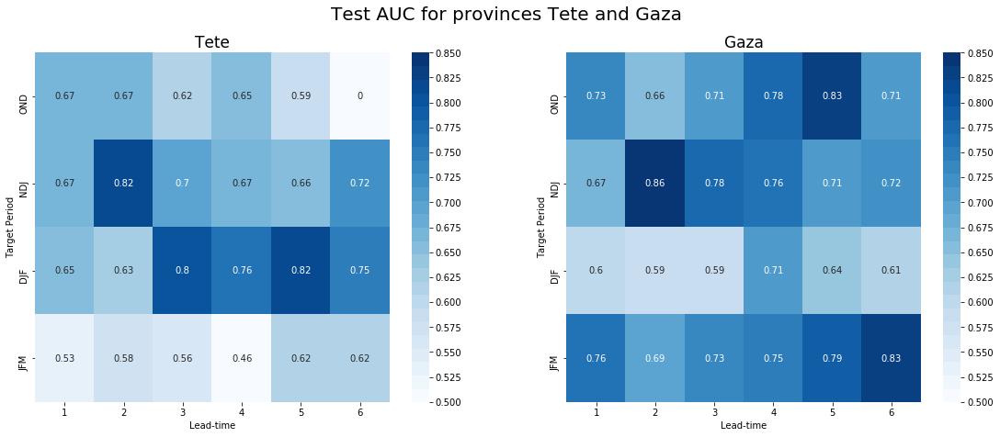

In [84]:
fig_auc, [ax1, ax2] = plt.subplots(1, 2, figsize = (19, 7))
sns.heatmap(AUC_tete, vmin = 0.5, vmax = 0.85, cmap = cmaplist15, xticklabels = lead_time, yticklabels = periods, annot = True, ax = ax1)
ax1.set_title('Tete', size = 17)
ax1.set_xlabel('Lead-time')
ax1.set_ylabel('Target Period')

sns.heatmap(AUC_gaza, vmin = 0.5, vmax = 0.85, cmap = cmaplist15, xticklabels = lead_time, yticklabels = periods, annot = True, ax = ax2)
ax2.set_title('Gaza', size = 17)
ax2.set_xlabel('Lead-time')
ax2.set_ylabel('Target Period')

colorbar = ax1.collections[0].colorbar
colorbar.set_ticks(np.linspace(0.5, 0.85, 15))

colorbar = ax2.collections[0].colorbar
colorbar.set_ticks(np.linspace(0.5, 0.85, 15))

fig_auc.suptitle('Test AUC for provinces Tete and Gaza', size = 20)

#fig_auc.savefig('AUC_province.pdf', dpi = 300)

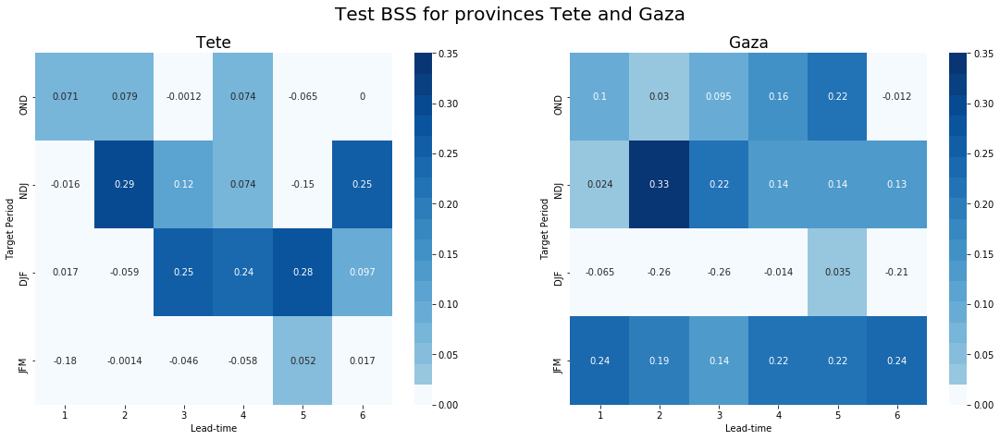

In [86]:
fig_bss, [ax1, ax2] = plt.subplots(1, 2, figsize = (19, 7))
sns.heatmap(BSS_tete, vmin = 0, vmax = 0.35, cmap = cmaplist, xticklabels = lead_time, yticklabels = periods, annot = True, ax = ax1)
ax1.set_title('Tete', size = 17)
ax1.set_xlabel('Lead-time')
ax1.set_ylabel('Target Period')

sns.heatmap(BSS_gaza, vmin = 0, vmax = 0.35, cmap = cmaplist, xticklabels = lead_time, yticklabels = periods, annot = True, ax = ax2)
ax2.set_title('Gaza', size = 17)
ax2.set_xlabel('Lead-time')
ax2.set_ylabel('Target Period')

colorbar = ax1.collections[0].colorbar
colorbar.set_ticks(np.linspace(-0.3, 0.35, 14))

colorbar = ax2.collections[0].colorbar
colorbar.set_ticks(np.linspace(-0.3, 0.35, 14))

fig_bss.suptitle('Test BSS for provinces Tete and Gaza', size = 20)

fig_bss.savefig('BSS_province.pdf', dpi = 300)